# Import Neccessary Libraries

In [1]:
!pip install -q --upgrade scipy

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
import statsmodels.api as sm
from statsmodels.formula.api import ols

import warnings 
warnings.filterwarnings("ignore")

plt.style.use('seaborn')
%config InlineBackend.figure_formats = set(('retina', 'svg'))

%matplotlib inline

In [3]:
adverts = pd.read_csv("adverts.csv")
adverts.head(2)

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
0,202006039777689,0.0,NaN,Grey,Volvo,XC90,NEW,NaN,73970,SUV,False,Petrol Plug-in Hybrid
1,202007020778260,108230.0,61,Blue,Jaguar,XF,USED,2011.0,7000,Saloon,False,Diesel


# A Brief Description of the Coursework and Data


<font size="4">This is a Coursework project for Principles of Data Science. The dataset is a **Car Sale Adverts** dataset provided by **AutoTrader**, one
of Manchester Metropolitan University industry partners. The dataset contains an anonymised collection of adverts with information on vehicles such as brand, type, colour, mileage, as well as the selling price.
</font>

<font size="5">**Columns Definitions**</font>
* <font size="4">**public_reference:** The unique ID for each car advert</font>
* <font size="4">**mileage:** The total distance covered by the car</font>

[DEFINITION FROM>>>>>https://dictionary.cambridge.org/dictionary/english/mileage]: #

* <font size="4">**reg_code:** This is the unique code for each year of registration.</font>
* <font size="4">**standard_color:** The colour of the car </font>
* <font size="4">**standard_make:** The brand of the car</font>
* <font size="4">**standard_model:** The brand model of the car</font>
* <font size="4">**vehicle_condition:** The vehicle condition; either *NEW* or *USED*</font>
* <font size="4">**year_of_registration:** The first registration year of the car</font>
* <font size="4">**price:** The price of the car in pounds(£)</font>
* <font size="4">**body_type:** The body type of the car i.e SUV, Saloon, Minibus and so on</font>
* <font size="4">**crossover_car_and_van:** A crossover is a type of automobile with increased ride height that is built on unibody chassis construction shared with passenger cars, as opposed to traditional sport utility vehicles (SUV) which are built on a body-on-frame chassis construction similar to pickup trucks.</font>

[DEFINITION FROM>>>>>https://en.wikipedia.org/wiki/Crossover_(automobile)]: #

* <font size="4">**fuel_type:** The type of fuel the car runs on.</font>

In [4]:
adverts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 402005 entries, 0 to 402004
Data columns (total 12 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   public_reference       402005 non-null  int64  
 1   mileage                401878 non-null  float64
 2   reg_code               370148 non-null  object 
 3   standard_colour        396627 non-null  object 
 4   standard_make          402005 non-null  object 
 5   standard_model         402005 non-null  object 
 6   vehicle_condition      402005 non-null  object 
 7   year_of_registration   368694 non-null  float64
 8   price                  402005 non-null  int64  
 9   body_type              401168 non-null  object 
 10  crossover_car_and_van  402005 non-null  bool   
 11  fuel_type              401404 non-null  object 
dtypes: bool(1), float64(2), int64(2), object(7)
memory usage: 34.1+ MB


In [5]:
round(adverts.drop(columns='public_reference').describe(),2)

,mileage,year_of_registration,price
count,401878.00,368694.00,402005.00
mean,37743.60,2015.01,17341.97
std,34831.72,7.96,46437.46
min,0.00,999.00,120.00
25%,10481.00,2013.00,7495.00
50%,28629.50,2016.00,12600.00
75%,56875.75,2018.00,20000.00
max,999999.00,2020.00,9999999.00


In [6]:
adverts.describe(include='object')

,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,body_type,fuel_type
count,370148,396627,402005,402005,402005,401168,401404
unique,72,22,110,1168,2,16,9
top,17,Black,BMW,Golf,USED,Hatchback,Petrol
freq,36738,86287,37376,11583,370756,167315,216929


In [7]:
adverts.shape

(402005, 12)

<font size="4"> In the output above, there are 402,005 entries with 12 columns of different datatypes.</font>

<h2 style="text-align:center"> 
    <font size="5"> 
        <b>Column names and Datatypes</b>
    </font>
</h2>


| <font size="4">**Columns** | <font size="4">**Datatype** |
| ---- | ---- |
| <font size="4">public_reference | <font size="4">integer |
| <font size="4">mileage | <font size="4">float |
| <font size="4">reg_code | <font size="4">object |
| <font size="4">standard_colour | <font size="4">object |
| <font size="4">standard_make | <font size="4">object |
| <font size="4">standard_model | <font size="4">object |
| <font size="4">vehicle_condition | <font size="4">object |
| <font size="4">year_of_registration | <font size="4">float |
| <font size="4">price | <font size="4">integer |
| <font size="4">body_type | <font size="4">object |
| <font size="4">crossover_car_and_van | <font size="4">bool |
| <font size="4">fuel_type | <font size="4">object |

In [8]:
adverts.duplicated().any()

False

# Analysis of Univariate Distributions

<font size="4">Let's plot some distribution plots and see how some of the columns are distribiuted.</font>

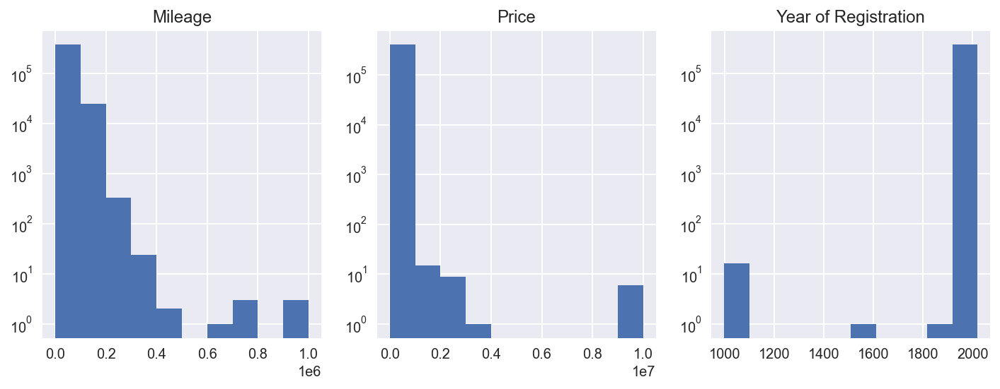

In [9]:
# Using a subplot to visualize 3 featrues distribution
fig, ax = plt.subplots(1,3,figsize=(12,4))
adverts['mileage'].hist(ax=ax[0])
ax[0].title.set_text('Mileage')
ax[0].set_yscale('log')

adverts['price'].hist(ax=ax[1])
ax[1].title.set_text('Price')
ax[1].set_yscale('log')

adverts['year_of_registration'].hist(ax=ax[2])
ax[2].title.set_text('Year of Registration')
ax[2].set_yscale('log')

plt.savefig('analysisofdistribution.png',dpi=300,bbox_inches='tight')

In [10]:
def plot_countplot(df,col,title,top_N=10):
    counts = df[col].value_counts()
    
    if len(df[col].unique()) < 5:
        plt.figure(figsize=(8,5))
        ax = sns.countplot(x=df[col],
                          order=counts.index,
                           lw = 0.5,
                           color = "steelblue"
                          )
        for p in ax.patches:
            ax.annotate(int(p.get_height()),(p.get_x() + p.get_width()/2,p.get_height()),ha='center',
            va ='bottom',fontsize=12)
        plt.title(title.upper(), fontsize=12, weight='bold')
        plt.xlabel(col.upper())
        
    else:
        plt.figure(figsize=(15,6))
        ax = sns.countplot(x=df[col],
                          order=df[col].value_counts().head(top_N).index,
                           lw = 0.5,
                           color = "steelblue"
                          )
        for p in ax.patches:
            ax.annotate(int(p.get_height()),(p.get_x() + p.get_width()/2,p.get_height()),ha='center',
            va ='bottom',fontsize=10)
            # for x,y in enumerate(counts):
            #     ax.text(0.7,x,y,weight='bold',fontsize=9.5)
            plt.title(title.upper(), fontsize=12,weight='bold')
            plt.xlabel(col.upper())

#### `Standard_colour`

In [11]:
adverts['standard_colour'].describe(include='object')

count     396627
unique        22
top        Black
freq       86287
Name: standard_colour, dtype: object

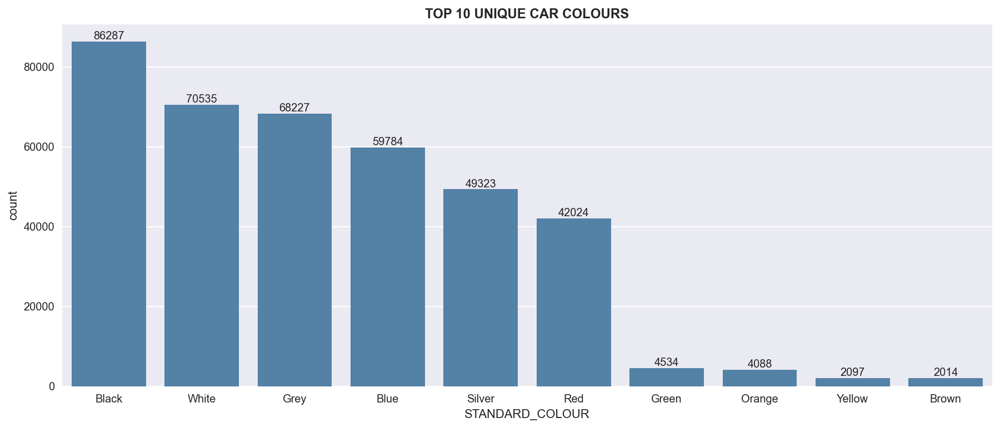

In [12]:
plot_countplot(adverts, 'standard_colour', 'Top 10 Unique car colours')
plt.savefig('uniquecars.png',dpi=300,bbox_inches='tight')

#### `Vehicle_condition`

In [13]:
adverts['vehicle_condition'].describe(include='object')

count     402005
unique         2
top         USED
freq      370756
Name: vehicle_condition, dtype: object

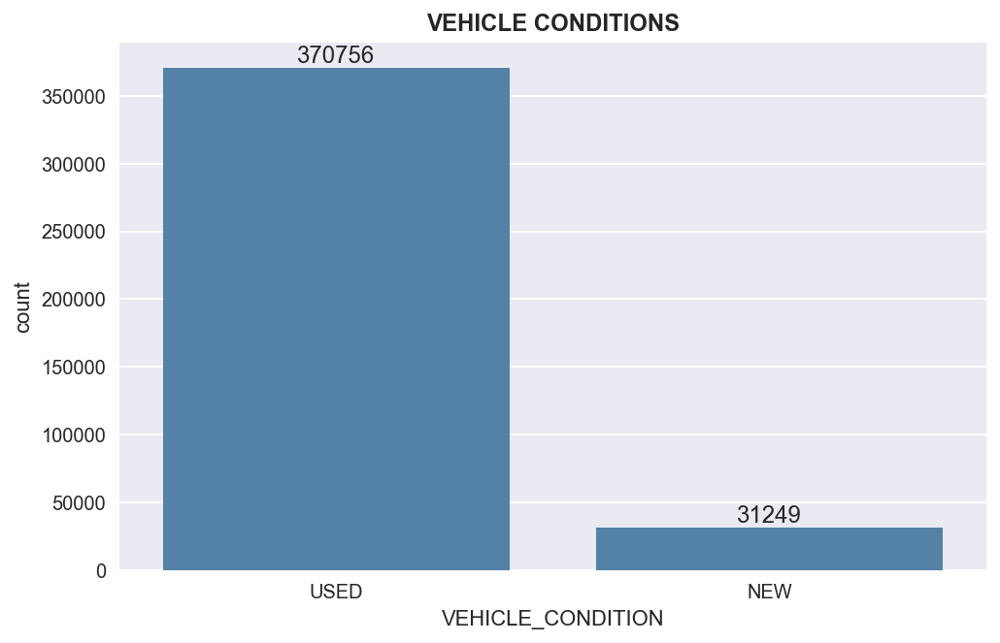

In [14]:
plot_countplot(adverts,'vehicle_condition', 'Vehicle Conditions')
plt.savefig('vehiclecondition.png',bbox_inches='tight',dpi=300)

#### `Body_type`

In [15]:
adverts['body_type'].describe(include='object')

count        401168
unique           16
top       Hatchback
freq         167315
Name: body_type, dtype: object

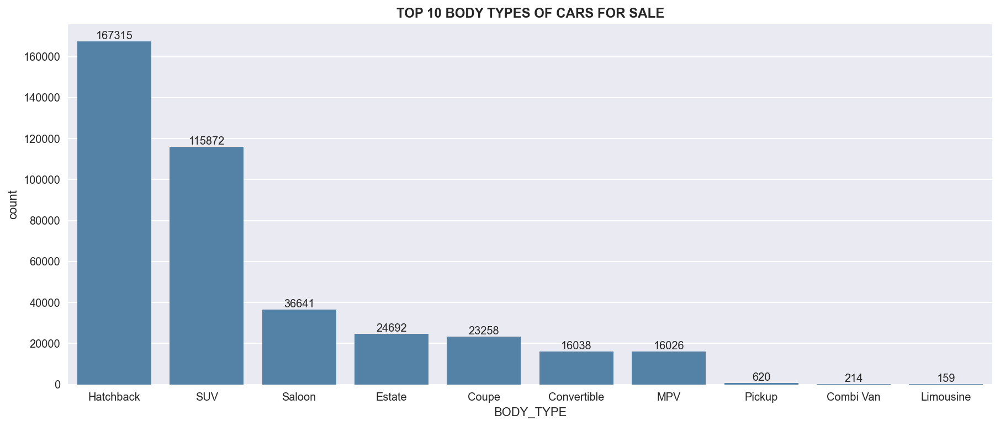

In [16]:
plot_countplot(adverts,'body_type', 'Top 10 Body Types of Cars For Sale')
plt.savefig('bodytypes.png',dpi=300,bbox_inches='tight')

#### `Fuel_type`

In [17]:
adverts['fuel_type'].describe(include='object')

count     401404
unique         9
top       Petrol
freq      216929
Name: fuel_type, dtype: object

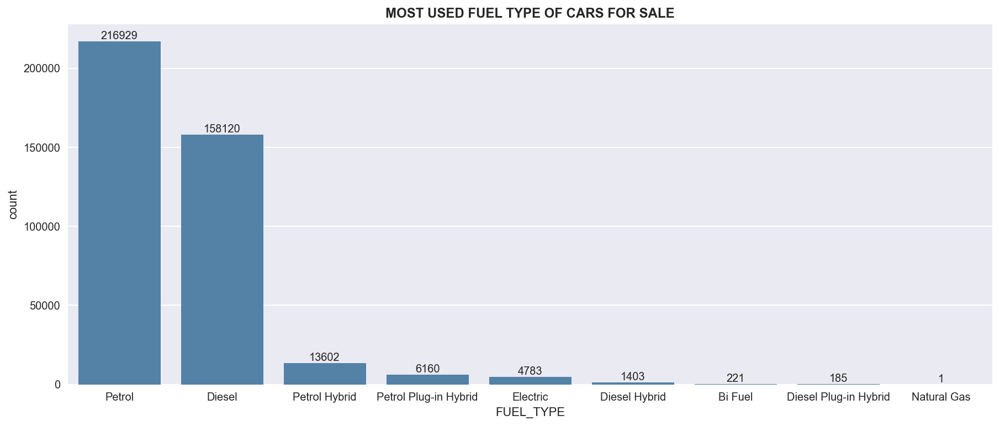

In [18]:
plot_countplot(adverts,'fuel_type', 'Most Used Fuel Type of cars for sale')
plt.savefig('fueltype.png',dpi=300,bbox_inches='tight')

#### `Standard_make`

In [19]:
adverts['standard_make'].describe(include='object')

count     402005
unique       110
top          BMW
freq       37376
Name: standard_make, dtype: object

In [20]:
adverts['standard_make'].value_counts().head(20)

BMW              37376
Audi             35280
Volkswagen       34246
Vauxhall         33700
Mercedes-Benz    31917
Nissan           19892
Toyota           17671
Peugeot          15161
Land Rover       14795
Renault          12821
SKODA            12276
Kia              12241
Volvo            11478
MINI             11345
Hyundai          11229
Citroen          10503
Fiat             10132
SEAT              9660
Honda             9405
Jaguar            7534
Name: standard_make, dtype: int64

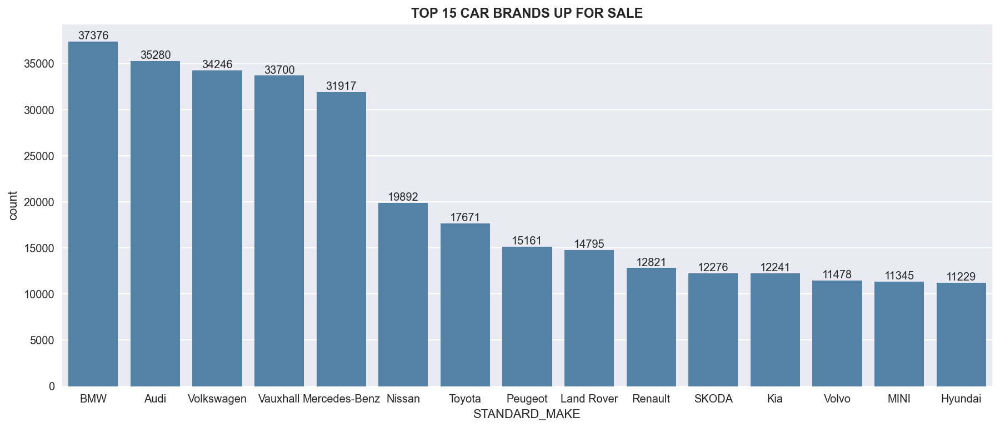

In [21]:
plot_countplot(adverts,'standard_make', 'Top 15 Car Brands up for sale',15)
plt.savefig('brands.png',dpi=300,bbox_inches='tight')

#### `Year_of_registration`

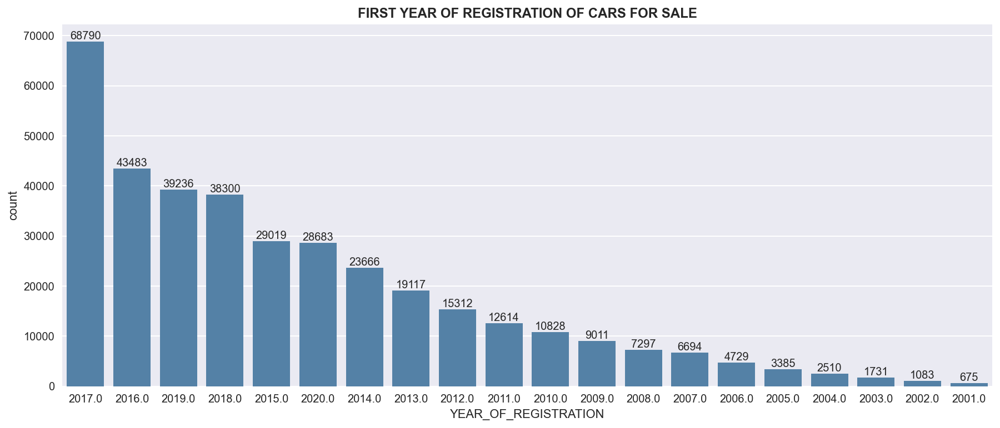

In [22]:
plot_countplot(adverts, 'year_of_registration', 'First year of registration of cars for sale', 20)
plt.savefig('yearofreg.png',dpi=300,bbox_inches='tight')

# Identify missing values

<font size="4"> In addition, there are some columns in the dataset that doesn't have complete observations of 402,005. Let's check out the columns with missing values in the next cell below.</font>

In [23]:
# A dataframe showing the columns, number of missing values and their 
# proportion of missing values
pd.DataFrame(dict(missing_value=adverts.isnull().sum(),
             missing_value_proportion=adverts.isnull().sum() * 100 / len(adverts))
)

,missing_value,missing_value_proportion
public_reference,0,0.000000
mileage,127,0.031592
reg_code,31857,7.924528
standard_colour,5378,1.337794
standard_make,0,0.000000
standard_model,0,0.000000
vehicle_condition,0,0.000000
year_of_registration,33311,8.286215
price,0,0.000000
body_type,837,0.208206


<font size="4"> From the dataframe above, 6 of the columns have missing values with `year_of_registration` and `reg_code` having the highest percentage of missing values, ***8.29%*** and ***7.92%*** respectively. Other columns with missing values are ***(standard_colour, 1.34%), (mileage,0.03%), (body_type, 0.20%), and (fuel_type, 0.15%).***

# Dealing with missing vlaues

<font size="4"> Let's start with the columns with highest missing values.</font>

#### `Year of Registration` & `Reg Code`

<font size="4"> Scraping the UK's car registration codes for age and year identifiers tables from the wikipedia page [UK Vehicle Registration Codes](https://en.wikipedia.org/wiki/Vehicle_registration_plates_of_the_United_Kingdom).</font>

In [24]:
# !pip install beautifulsoup4
# !pip install request

In [25]:
import requests 
from bs4 import BeautifulSoup

In [26]:
# Age identifier
def scrape(website):
    
    col1=[]
    col2=[]
    col3=[]
    
    url = str(website)
    s = requests.Session()
    r = s.get(url,timeout=10)
    c = r.content
    soup = BeautifulSoup(c, 'html.parser')
    
    # get all tables in the url
    age_identifier = soup.find_all('table',{'class':"wikitable"})
    
    # table 1
    rows1 = age_identifier[1].find_all('tr')
    
    # table 2
    rows2 = age_identifier[2].find_all('tr')
    
    # table headers
    headers = [header.text.strip() for header in rows1[0].find_all('th')]
    
    # Iterate over table 1
    for row in rows1:
        values = row.find_all('td')
        years = row.find_all('th')
        if len(values) == 2:
            col1.append(years[0].find(text=True).strip())
            col2.append(values[0].find(text=True).strip())
            col3.append(values[1].find(text=True).strip())
    
    # Iterate over table 1
    for row in rows2:
        values = row.find_all('td')
        years = row.find_all('th')
        if len(values) == 2:
            col1.append(years[0].find(text=True).strip())
            col2.append(values[0].find(text=True).strip())
            col3.append(values[1].find(text=True).strip())
   
    # Create a dictionary of the header
    d = dict([(x,0) for x in headers])
    
    # Append dictionary with corresponding data list
    d['Year'] = col1
    d['1 March – 31 August'] = col2
    d['1 September – 28/29 February'] = col3
    
    # Create a dataframe
    df = pd.DataFrame(d)

    return df

In [27]:
age_identifier_df = scrape("https://en.wikipedia.org/wiki/Vehicle_registration_plates_of_the_United_Kingdom")
age_identifier_df.sample(3)

,Year,1 March – 31 August,1 September – 28/29 February
12,2013/14,13,63
8,2009/10,09,59
25,2026/27,26,76


In [28]:
# Split the year column to get the years before the "/" and assign it back to the year column
age_identifier_df['Year'] = age_identifier_df['Year'].str.split('/',expand=True)[0]
age_identifier_df.sample(3)

,Year,1 March – 31 August,1 September – 28/29 February
15,2016,16,66
4,2005,05,55
11,2012,12,62


In [29]:
# years Identifier
def scrape2(website):
    
    col1=[]
    col2=[]
    
    url = str(website)
    s = requests.Session()
    r = s.get(url,timeout=10)
    c = r.content
    soup = BeautifulSoup(c, 'html.parser')
    
    # get all tables in the url
    age_identifier = soup.find_all('table',{'class':"wikitable"})
    
    # table 1
    rows1 = age_identifier[4].find_all('tr')
    
    # table 2
    rows2 = age_identifier[5].find_all('tr')
    
    # table headers
    headers = [header.text.strip() for header in rows1[0].find_all('th')]
    
    # Iterate over table 1
    for row in rows1:
        year = row.find_all('td')
        letter = row.find_all('th')
        if len(year) == 1:
            col1.append(letter[0].find(text=True).strip())
            col2.append(year[0].find(text=True).strip())
            
    
    # Iterate over table 1
    for row in rows2:
        year = row.find_all('td')
        letter = row.find_all('th')
        if len(year) == 1:
            col1.append(letter[0].find(text=True).strip())
            col2.append(year[0].find(text=True).strip())
            
   
    # Create a dictionary of the header
    d = dict([(x,0) for x in headers])
    
    # Append dictionary with corresponding data list
    d['Letter'] = col1
    d['Dates of issue'] = col2
    
    # Create a dataframe
    df = pd.DataFrame(d)

    return df

In [30]:
year_identifier_df = scrape2("https://en.wikipedia.org/wiki/Vehicle_registration_plates_of_the_United_Kingdom")

In [31]:
# Get latter year from the "dates of issue " column
year_identifier_df['Year'] = year_identifier_df['Dates of issue'].str.split(' ', expand=True)[2]
year_identifier_df['Year'][0] = 1963

In [32]:
year_identifier_df.head(2)

,Letter,Dates of issue,Year
0,A,February 1963,1963
1,B,1 January 1964 – 31 December 1964,1964


In [33]:
# Unique years of registration
adverts['year_of_registration'].unique()

array([  nan, 2011., 2017., 2016., 2015., 2013., 2008., 2019., 2010.,
       2012., 2018., 2009., 1984., 2014., 2003., 2006., 2020., 2005.,
       2000., 2002., 2007., 2004., 1991., 2001., 1986., 1998., 1990.,
       1993., 1987., 1994., 1999., 1970., 1988., 1995., 1997., 1969.,
       1992., 1989., 1996., 1976., 1983., 1980., 1973., 1962., 1967.,
       1972., 1982., 1968., 1979., 1964., 1933., 1981., 1985., 1978.,
       1971., 1974., 1966., 1977., 1961., 1965., 1007., 1957., 1515.,
       1963., 1063., 1954., 1975., 1955., 1009., 1016., 1960., 1956.,
       1959., 1909., 1934., 1958., 1010., 1950., 1008., 1018.,  999.,
       1017., 1952., 1006., 1015.])

<font size="4"> There are some human errors in the `year_of_registration` column. For example, we have 1008,1009, and 1018 instead of 2008,2009,and 2018. Firstly, let's sort the years in ascending order.

In [34]:
sorted(list(adverts['year_of_registration'].unique()))[:15]

[nan,
 999.0,
 1006.0,
 1007.0,
 1008.0,
 1009.0,
 1010.0,
 1015.0,
 1016.0,
 1017.0,
 1018.0,
 1063.0,
 1515.0,
 1909.0,
 1933.0]

In [35]:
adverts[adverts['year_of_registration'].isin([999.0, 1006.0, 1007.0, 1008.0, 1009.0, 1010.0, 1015.0, 1016.0, 1017.0, 1018.0, 1063.0, 1515.0, 1909.0])]

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
59010,202006270588110,14000.0,07,Blue,Toyota,Prius,USED,1007.0,7000,Hatchback,False,Petrol Hybrid
69516,202010155035879,96659.0,65,Black,Audi,A4 Avant,USED,1515.0,10385,Estate,False,Diesel
84501,202009163810376,37771.0,63,Black,Smart,fortwo,USED,1063.0,4785,Coupe,False,Petrol
114737,202008102305925,30000.0,59,Red,Toyota,AYGO,USED,1009.0,4695,Hatchback,False,Petrol
120858,202010064654489,27200.0,66,Black,MINI,Clubman,USED,1016.0,18990,Estate,False,Diesel
148003,202010104836987,31172.0,09,Black,Hyundai,i10,USED,1909.0,3950,Hatchback,False,Petrol
190556,202010205206488,58470.0,10,Black,Fiat,Punto Evo,USED,1010.0,3785,Hatchback,False,Petrol
199830,202009013167637,23000.0,59,Silver,MINI,Hatch,USED,1009.0,5995,Hatchback,False,Petrol
199987,202010225311657,104000.0,08,Silver,BMW,1 Series,USED,1008.0,4395,Convertible,False,Petrol
201616,202010134937656,8600.0,68,Silver,BMW,M2,USED,1018.0,41990,Coupe,False,Petrol


In [36]:
# Replace the wrongly imputed years with the correct ones
adverts['year_of_registration'].replace([1006.0, 1007.0, 1008.0, 1009.0, 1010.0, 1015.0, 1016.0, 1017.0, 1018.0],
                                        [2006.0, 2007.0, 2008.0, 2009.0, 2010.0, 2015.0, 2016.0, 2017.0, 2018.0], inplace=True)

<font size="4">A **Hyundai i10** has a `year_of_registration` of **1909**. Whereas, the car's first production year is **2007**. The `reg_code` for that particular observation is **09**, which in the UK Car Registration Codes, under the age identifer table, cars with `reg_code` **09** were registered in the year **2009** which actually makes more sense.

<font size="4">Also, An **Audi A4 Avant** has a `year_of_registration` of **1515** and `reg_code` for that particular observation is **65**, which in the UK Car Registration Codes, under the age identifer table, cars with `reg_code` **65** were registered in the year **2015**.

In [37]:
# replace year 1909 with 2009
adverts.loc[adverts['year_of_registration']==1909, 'year_of_registration'] = 2009

In [38]:
# Replace 1515 with 2015
adverts.loc[adverts['year_of_registration']==1515, 'year_of_registration'] = 2015

In [39]:
# Replace 1063 wit 2013
adverts.loc[adverts['year_of_registration']==1063.0, 'year_of_registration'] = 2013

<font size="4">Below is a dataframe showing `year_of_registration` for cars before the **1963**

In [40]:
adverts[adverts['year_of_registration']<1963].head()

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
15575,202010034549723,45162.0,NaN,Silver,Daimler,SP,USED,1962.0,49995,Convertible,False,Petrol
28925,202006140121316,26000.0,NaN,Black,Austin,Seven,USED,1933.0,9995,Saloon,False,Petrol
49553,202010145006063,9000.0,NaN,NaN,Land Rover,Series II,USED,1961.0,39995,Pickup,False,Petrol
56415,202007301903344,NaN,NaN,Red,Jaguar,E-Type,USED,1962.0,174995,Convertible,False,Petrol
65299,202008062171865,90000.0,NaN,Multicolour,International,Harvester A100,USED,1957.0,24995,Pickup,False,Petrol


<font size="4">The years above do not have reg_codes or have the wrong reg_code assigned to them. 

In [41]:
# subsetting missing values in year_of_registration columns.
missing_year_of_reg = adverts.query("year_of_registration.isnull()")
missing_year_of_reg

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
0,202006039777689,0.0,NaN,Grey,Volvo,XC90,NEW,NaN,73970,SUV,False,Petrol Plug-in Hybrid
17,201911043995897,5.0,NaN,NaN,Nissan,X-Trail,NEW,NaN,27595,SUV,False,Diesel
19,202008272998331,0.0,NaN,White,Volkswagen,T-Cross,NEW,NaN,25000,SUV,False,Petrol
37,202001306737473,0.0,NaN,White,Fiat,Panda,NEW,NaN,13999,Hatchback,False,Petrol
44,202003178531910,0.0,NaN,NaN,Honda,Civic,NEW,NaN,19495,Hatchback,False,Petrol
...,...,...,...,...,...,...,...,...,...,...,...,...
401860,202010024501227,10.0,NaN,Silver,Mitsubishi,Shogun Sport,NEW,NaN,31999,SUV,False,Diesel
401890,202010104843364,5.0,NaN,Red,BMW,Z4,NEW,NaN,47910,Convertible,False,Petrol
401902,202010134960554,10.0,NaN,White,BMW,3 Series,NEW,NaN,35023,Saloon,False,Petrol
401905,202010144983518,0.0,NaN,Red,Land Rover,Range Rover Evoque,NEW,NaN,44995,SUV,False,Petrol


<font size="4">From the subset above, we can see there are also missing values in the `reg_code` column and some other columns. The `vehicle_condition` also seems to have majorly  ***NEW*** cars. However, these are still assumptions. Let's write some codes below to check.

In [42]:
missing_year_of_reg['vehicle_condition'].value_counts()

NEW     31249
USED     2062
Name: vehicle_condition, dtype: int64

In [43]:
missing_year_of_reg['reg_code'].isnull().sum()

31570

<font size="4"> About 31,570 missing values in the `reg_code` column also have their `year_of_registration` to be missing</font>

<font size="4"> Let's check for missing values in the `missing_year_of_reg` dataframe.

In [44]:
missing_year_of_reg.isnull().sum()

public_reference             0
mileage                     19
reg_code                 31570
standard_colour           1132
standard_make                0
standard_model               0
vehicle_condition            0
year_of_registration     33311
price                        0
body_type                  349
crossover_car_and_van        0
fuel_type                  297
dtype: int64

In [45]:
assert len(missing_year_of_reg[missing_year_of_reg['vehicle_condition']=="NEW"]) == len(adverts[adverts['vehicle_condition']=="NEW"])

<font size="4">The cell above proves that we have the same amount of missing values for cars in ***NEW*** condition in the `adverts`(original) dataframe and also the `missing_year-of_reg` dataframe. Which also implies that, for every ***NEW*** car, there's no year of registration and reg_code attached to it. This is because, it hasn't been purchased and registered by any user.</font>

<font size="4">Therefore, let's fill the missing `year_of_registration` for **NEW** cars with ***2020*** and `red_code` for ***NEW*** cars with ***20***. This is because the maximum year_of_registration in the dataset is 2020 and also the `public_reference` column indicates the year, month, and day the advert was made.</font>

In [46]:
missing_year_of_reg.loc[missing_year_of_reg['vehicle_condition']=="NEW", "year_of_registration"] = 2020

In [47]:
missing_year_of_reg.loc[missing_year_of_reg['vehicle_condition']=="NEW", "reg_code"] = 20

In [48]:
missing_year_of_reg.isnull().sum()

public_reference            0
mileage                    19
reg_code                  321
standard_colour          1132
standard_make               0
standard_model              0
vehicle_condition           0
year_of_registration     2062
price                       0
body_type                 349
crossover_car_and_van       0
fuel_type                 297
dtype: int64

<font size="4">After filling the `year_of_registration` with ***2021*** and `reg_code` for ***NEW*** cars with ***20***, we still have some null values in both columns. Let's check out the dataframe once again maybe we can see some insights on how to fill the missing values in the `year_of_registration`.</font>

In [49]:
# This code ouputs where year_of_registration is missing but reg_code is not
reg_code_not_missing = missing_year_of_reg[missing_year_of_reg['year_of_registration'].isnull() & ~(missing_year_of_reg['reg_code'].isnull())]
reg_code_not_missing

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
54,202007030806426,30000.0,18,Red,Vauxhall,Insignia,USED,NaN,11990,Hatchback,False,Petrol
83,202008222801747,42847.0,61,Red,Honda,Jazz,USED,NaN,5695,Hatchback,False,Petrol
865,202010084741550,43130.0,66,White,Land Rover,Range Rover Sport,USED,NaN,35990,SUV,False,Diesel
968,202010305607535,63369.0,17,Blue,SKODA,Rapid Spaceback,USED,NaN,7490,Hatchback,False,Diesel
1256,202010225294466,18715.0,68,White,Volvo,V40,USED,NaN,16950,NaN,False,Petrol
...,...,...,...,...,...,...,...,...,...,...,...,...
400336,202010315635977,66287.0,63,Blue,Vauxhall,Astra GTC,USED,NaN,8400,Coupe,False,Petrol
400725,202008252905656,45.0,20,Silver,Land Rover,Range Rover Evoque,USED,NaN,46945,SUV,False,Diesel
401314,202010315635541,12522.0,67,Red,Dacia,Sandero,USED,NaN,6300,Hatchback,False,Petrol
401323,201909222504136,46000.0,13,Grey,Volkswagen,Caravelle,USED,NaN,22995,MPV,False,Diesel


<font size="4">There are **1741** observations where `year_of_registration` is missing and `reg_code` isn't

In [50]:
reg_code_not_missing['vehicle_condition'].unique()

array(['USED'], dtype=object)

<font size="4">Only **USED** cars have their year_of_registration missing but have some values for reg_code.

In [51]:
# so as to retain the original index
reg_code_not_missing['original_index'] = reg_code_not_missing.index

In [52]:
# set reg_code as index for easy mapping
reg_code_not_missing.set_index('reg_code',inplace=True)

In [53]:
reg_code_not_missing.sample(2)

,public_reference,mileage,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type,original_index
reg_code,,,,,,,,,,,,
69,202010175120396,8601.0,Silver,Volkswagen,Passat,USED,NaN,21689,Saloon,False,Petrol,327385
56,202002297862720,121000.0,Black,Mitsubishi,L200,USED,NaN,4750,Pickup,True,Diesel,61582


In [54]:
# convert the codes  columns in the age_identifier dataframe to list and add the lists together 
agelist1 = age_identifier_df['1 March – 31 August'].values.tolist()
agelist2 = age_identifier_df['1 September – 28/29 February'].values.tolist()
agelist = agelist1 + agelist2

In [55]:
# add year to itself
year = age_identifier_df['Year'].values.tolist() + age_identifier_df['Year'].values.tolist()

In [56]:
modified_age_identifier = pd.DataFrame(dict(year=year,code=agelist))

In [57]:
modified_age_identifier.head(2)

,year,code
0,2001,Y
1,2002,02


In [58]:
# filling the missing values in year of registration by mapping the year with reg_code for only age identifier
reg_code_not_missing['year_of_registration'] = reg_code_not_missing.index.map(modified_age_identifier.set_index('code')['year'])

In [59]:
# resetting the index back  to the original index so i can merge with my intial data 
reg_code_not_missing = reg_code_not_missing.reset_index().set_index('original_index')

In [60]:
# selecting the latter years for letter reg_codes
year_identifier_df= year_identifier_df.loc[21:,:].drop(columns='Dates of issue')

In [61]:
year_identifier_df.head(2)

,Letter,Year
21,A,1983
22,B,1984


In [62]:
# create dictionaries from the year identifier dataframe to fill the missing years of registration with Letter reg_codes
year_dict = dict(zip(year_identifier_df['Letter'],year_identifier_df['Year']))
reg_code_not_missing['year_of_registration'] = reg_code_not_missing['year_of_registration'].fillna(reg_code_not_missing['reg_code'].astype(str).map(year_dict))

In [63]:
year_dict

{'A': '1983',
 'B': '1984',
 'C': '1985',
 'D': '1986',
 'E': '1987',
 'F': '1988',
 'G': '1989',
 'H': '1990',
 'J': '1991',
 'K': '1992',
 'L': '1993',
 'M': '1994',
 'N': '1995',
 'P': '1996',
 'R': '1997',
 'S': '1998',
 'T': '1999',
 'V': '1999',
 'W': '2000',
 'X': '2000',
 'Y': '2001'}

In [64]:
reg_code_not_missing[reg_code_not_missing['year_of_registration'].isna()]

,reg_code,public_reference,mileage,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
original_index,,,,,,,,,,,,
80899,CA,202010014455127,2000.0,Green,Caterham,Seven,USED,NaN,21995,Convertible,False,Petrol
166035,723xuu,202010195172029,4050.0,Turquoise,Chevrolet,Corvette,USED,NaN,89990,NaN,False,Petrol


In [65]:
# replacing the missing value in year of registration in the missing year of reg dataframe
(missing_year_of_reg.loc[missing_year_of_reg['year_of_registration']
                         .isnull() & ~(missing_year_of_reg['reg_code'].isnull()),'year_of_registration']
) = reg_code_not_missing['year_of_registration']

In [66]:
missing_year_of_reg.isnull().sum()

public_reference            0
mileage                    19
reg_code                  321
standard_colour          1132
standard_make               0
standard_model              0
vehicle_condition           0
year_of_registration      323
price                       0
body_type                 349
crossover_car_and_van       0
fuel_type                 297
dtype: int64

<font size="4">Filling the rows that have missing values in `year_of_registration` and `vehicle_condition` = **USED** with the mode of the year_of_registration of USED cars.

In [67]:
mode_used_cars = missing_year_of_reg.groupby('vehicle_condition')['year_of_registration'].apply(pd.Series.mode)[1]
mode_used_cars

'2017'

In [68]:
missing_year_of_reg.loc[missing_year_of_reg['year_of_registration'].isnull() & (missing_year_of_reg['reg_code'].isnull()),'year_of_registration'] = int(mode_used_cars)

In [69]:
missing_year_of_reg.isnull().sum()

public_reference            0
mileage                    19
reg_code                  321
standard_colour          1132
standard_make               0
standard_model              0
vehicle_condition           0
year_of_registration        2
price                       0
body_type                 349
crossover_car_and_van       0
fuel_type                 297
dtype: int64

In [70]:
# Drop the two remaining missing observations in the year_of_registration column
(missing_year_of_reg
 .drop(missing_year_of_reg[missing_year_of_reg['year_of_registration'].isnull()].index,
      inplace=True)
)

In [71]:
missing_year_of_reg.isnull().sum()

public_reference            0
mileage                    19
reg_code                  321
standard_colour          1132
standard_make               0
standard_model              0
vehicle_condition           0
year_of_registration        0
price                       0
body_type                 348
crossover_car_and_van       0
fuel_type                 297
dtype: int64

<font size="4">Apply all changes to the main dataframe

In [72]:
adverts.loc[adverts['vehicle_condition']=="NEW", "year_of_registration"] = 2020
adverts.loc[adverts['vehicle_condition']=="NEW", "reg_code"] = 20

In [73]:
# fill missing values
(adverts.loc[(adverts['year_of_registration']
             .isnull()) & 
             ~(adverts['reg_code'].isnull()), 'year_of_registration'] 
)= missing_year_of_reg['year_of_registration']


In [74]:
# fill missng values with the year of registration mode of used cars
adverts.loc[adverts['year_of_registration'].isnull() & (adverts['reg_code'].isnull()),'year_of_registration'] = int(mode_used_cars)

In [75]:
adverts.isnull().sum()

public_reference            0
mileage                   127
reg_code                  608
standard_colour          5378
standard_make               0
standard_model              0
vehicle_condition           0
year_of_registration        2
price                       0
body_type                 837
crossover_car_and_van       0
fuel_type                 601
dtype: int64

In [76]:
# Drop the two remaining missing observations in the year_of_registration column
(adverts
 .drop(adverts[adverts['year_of_registration'].isnull()].index,
      inplace=True)
)

<font size="4">After filling the `year_of_registration` with  the `reg_code`, let's drop the reg_code column

In [77]:
adverts.drop(columns='reg_code', inplace=True)

In [78]:
adverts.isnull().sum()

public_reference            0
mileage                   127
standard_colour          5378
standard_make               0
standard_model              0
vehicle_condition           0
year_of_registration        0
price                       0
body_type                 836
crossover_car_and_van       0
fuel_type                 601
dtype: int64

In [79]:
adverts.shape

(402003, 11)

In [80]:
adverts['year_of_registration'].unique()

array([2020.0, 2011.0, 2017.0, 2016.0, 2015.0, 2013.0, 2008.0, 2019.0,
       2010.0, 2012.0, 2018.0, 2009.0, 1984.0, 2014.0, 2003.0, '2018',
       2006.0, '2011', 2005.0, 2000.0, 2002.0, 2007.0, 2004.0, 1991.0,
       2001.0, '2016', 1986.0, 1998.0, '2017', 1990.0, 1993.0, 1987.0,
       1994.0, '2020', 1999.0, '2005', 1970.0, '2015', '2019', 1988.0,
       1995.0, 1997.0, 1969.0, '2012', 1992.0, 1989.0, 1996.0, '2006',
       '2044', '1984', 1976.0, 1983.0, 1980.0, '2014', 1973.0, 1962.0,
       '1996', 1967.0, 1972.0, 1982.0, 1968.0, '2009', 1979.0, 1964.0,
       '2010', '1987', '2035', 1933.0, '2013', 1981.0, '1997', 1985.0,
       1978.0, 1971.0, '2001', 1974.0, '2004', 1966.0, 1977.0, 1961.0,
       '1993', 1965.0, '2008', '2007', 1957.0, 1963.0, 1954.0, 1975.0,
       '1985', 1955.0, 1960.0, 1956.0, '1994', 1959.0, '1991', '1990',
       '1998', 1934.0, '2003', '2045', '2002', '1995', '1988', '1999',
       1958.0, 1950.0, 999.0, '2038', '1989', '1986', '1983', 1952.0,
       

In [81]:
adverts['year_of_registration'] = adverts['year_of_registration'].astype('int64')

In [82]:
above_2020 = adverts[adverts['year_of_registration']> 2020]

In [83]:
# Filling with the mode  year of registration of each standard make and model
irregular = adverts[adverts['year_of_registration']> 2021][['standard_make','standard_model']]
results = []
for i, j in irregular.iterrows():
    result = adverts[(adverts['standard_make']==j['standard_make']) & (adverts['standard_model']==j['standard_model'])]\
    ['year_of_registration'].value_counts().sort_values(ascending=False).index[0]
    results.append(result)
irregular['new_year_of_registration'] = results
adverts.loc[adverts['year_of_registration']> 2021, 'year_of_registration'] = irregular['new_year_of_registration']

In [84]:
adverts.loc[above_2020.index]

,public_reference,mileage,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
9940,202010225293464,32001.0,Orange,Renault,Captur,USED,2020,7400,SUV,False,Petrol
28559,202010215252376,58686.0,Black,Hyundai,i30,USED,2015,6900,NaN,False,Diesel
167430,202010225293472,55643.0,Grey,Citroen,DS4,USED,2013,6800,Hatchback,False,Diesel
231213,202010225293467,61370.0,Black,Vauxhall,Mokka,USED,2015,7450,NaN,False,Diesel
265390,201912315687909,23157.0,Black,Mercedes-Benz,E Class,USED,2017,26550,NaN,False,Diesel
329449,202010225293425,39312.0,Silver,Renault,Captur,USED,2020,8000,SUV,False,Petrol
357325,202010215252378,31487.0,White,Suzuki,Baleno,USED,2017,6950,NaN,False,Petrol


In [85]:
adverts.shape

(402003, 11)

In [86]:
# drop rows where year off registration is bellow 1900
adverts = adverts[~(adverts['year_of_registration']< 1900)]

In [87]:
adverts.shape

(402000, 11)

<font size="4">Creating a function to fill missing categorical values with the mode

In [88]:
adverts.groupby(['standard_make', 'standard_model'])['body_type'].apply(lambda x: x.fillna(stats.mode(x)[0][0])).unique()

array(['SUV', 'Saloon', 'Hatchback', 'Convertible', 'Limousine', 'Estate',
       'MPV', 'Coupe', nan, 'Combi Van', 'Pickup', 'Panel Van', 'Minibus',
       'Window Van', 'Camper', 'Car Derived Van', 'Chassis Cab'],
      dtype=object)

In [89]:
def fillna_with_mode(missing_col):
    adverts[missing_col] = adverts.groupby(['standard_make', 'standard_model'])[missing_col].apply(lambda x: x.fillna(stats.mode(x)[0][0]))
    return adverts

#### `fuel_type`

In [90]:
adverts[adverts['fuel_type'].isnull()].head(2)

,public_reference,mileage,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
1309,202010305621511,10.0,Black,BMW,5 Series,NEW,2020,51395,Estate,False,NaN
2059,202003128359933,0.0,NaN,Jaguar,XF,NEW,2020,35990,Estate,False,NaN


In [91]:
len(adverts[adverts['fuel_type'].isnull()])

601

<font size="4"> There **601** missing values in the `fuel_type` column

In [92]:
# fill null values in fuel_type and assigning the resulting dataframe to a variable
adverts = fillna_with_mode('fuel_type')
adverts.head(2)

,public_reference,mileage,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
0,202006039777689,0.0,Grey,Volvo,XC90,NEW,2020,73970,SUV,False,Petrol Plug-in Hybrid
1,202007020778260,108230.0,Blue,Jaguar,XF,USED,2011,7000,Saloon,False,Diesel


<font size="4">Are there still missing values in the `fuel_type` column?

In [93]:
adverts['fuel_type'].isnull().sum()

51

<font size="4">There are still some missing values after filling with mode. Instinct tells me that there are observations that have **NaN** as the mode of such unique  make and model or the make and model only appeared once in the dataset and doesn't have a fuel_type assigned to it. 
    
<font size="4">Creating another function to handle the above situation. By grouping the make and model of each car, perform a value counts on the missing column and sort the counts in descending order. Then take the first index

In [94]:
def refillna_with_mode(missing_col):
    
    missing_values = adverts[adverts[missing_col].isnull()]
    brand_model = missing_values[['standard_make','standard_model']]
    
    results = []
    for i, j in brand_model.iterrows():
        try:
            result = (adverts[(adverts['standard_make']==j['standard_make']) & (adverts['standard_model']==j['standard_model'])][missing_col]
            .value_counts().sort_values(ascending=False).index[0])
            results.append(result)
        except IndexError:
            results.append("no value")
    brand_model[missing_col] = results
    return brand_model

In [95]:
# refilling the missing values with the mode of each category
filled_fuel_type = refillna_with_mode('fuel_type')

In [96]:
filled_fuel_type

,standard_make,standard_model,fuel_type
5675,Lexus,NX Unspecified,Petrol Hybrid
37035,Tiger,Era HSS,no value
50066,Lexus,NX Unspecified,Petrol Hybrid
50409,Ferrari,Dino,Petrol
62178,Lexus,IS Unspecified,Petrol
62445,Lexus,NX Unspecified,Petrol Hybrid
64398,Lexus,RX Unspecified,no value
72982,Aston Martin,Le Mans,no value
73464,Lexus,IS Unspecified,Petrol
74856,Lexus,NX Unspecified,Petrol Hybrid


In [97]:
# fill the missing values
adverts.loc[adverts['fuel_type'].isnull(), "fuel_type"] = filled_fuel_type['fuel_type']

In [98]:
adverts['fuel_type'].isnull().sum()

0

In [99]:
filled_fuel_type['fuel_type'].value_counts()

Petrol Hybrid    23
no value         16
Petrol           12
Name: fuel_type, dtype: int64

<font size="4">Replacing the ***No value*** with the most frequent fuel type in the enitre dataset

In [100]:
(adverts['fuel_type']
         .replace("no value", adverts['fuel_type'].value_counts().sort_values(ascending=False).index[0],
          inplace=True)
)

In [101]:
adverts.shape

(402000, 11)

#### `Mileage`

In [102]:
adverts.query("vehicle_condition=='USED'").isnull().sum().loc['mileage']

127

In [103]:
adverts.query("vehicle_condition=='NEW'").isnull().sum().loc['mileage']

0

<font size="4">Only **USED** cars have missing values in `mileage` column

In [104]:
missing_mileage = adverts[adverts['mileage'].isnull()]
display(missing_mileage.head())
missing_mileage.shape

,public_reference,mileage,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
4766,202003238706011,NaN,Grey,Subaru,Outback,USED,2017,35995,Estate,False,Petrol
9178,202010084771255,NaN,Blue,BMW,3 Series,USED,2020,36990,Saloon,False,Diesel Hybrid
11188,202009284304657,NaN,Red,Citroen,C1,USED,2009,2699,Hatchback,False,Petrol
17166,202009264233189,NaN,Silver,Audi,A5 Cabriolet,USED,2015,13495,Convertible,False,Petrol
17416,202008192672386,NaN,Grey,SKODA,Octavia,USED,2017,25085,Estate,False,Petrol


(127, 11)

<font size="4">Filling the missing value in the `mileage` column by taking the mileage median value of the groupby of `year_of_registration` and `fuel_type`

In [105]:
missing_mileage['mileage'] = adverts.query("vehicle_condition=='USED'").groupby(['year_of_registration','fuel_type'])['mileage'].apply(lambda x : x.fillna(round(x.median(),1)))

In [106]:
adverts.loc[adverts['mileage'].isnull(), 'mileage'] = missing_mileage['mileage']

In [107]:
adverts[adverts['mileage'].isnull()]

,public_reference,mileage,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type


#### `Standard_colour`

In [108]:
adverts['standard_colour'].isnull().sum()

5378

In [109]:
adverts = fillna_with_mode('standard_colour')

In [110]:
adverts['standard_colour'].isnull().sum()

73

In [111]:
# refilling the missing values with the mode of each category
filled_fuel_type = refillna_with_mode('standard_colour')

In [112]:
filled_fuel_type['standard_colour'].value_counts()

no value    24
Black       19
Grey         8
Red          7
Blue         5
Silver       5
White        3
Green        1
Yellow       1
Name: standard_colour, dtype: int64

In [113]:
adverts.loc[adverts['standard_colour'].isnull(), "standard_colour"] = filled_fuel_type['standard_colour']

In [114]:
adverts['standard_colour'].isnull().sum()

0

<font size="4">Replacing the ***No value*** with the most frequent)mode) standard colour in the enitre dataset

In [115]:
(adverts['standard_colour']
         .replace("no value", adverts['standard_colour'].mode()[0],
          inplace=True)
)

In [116]:
adverts['standard_colour'].isnull().sum()

0

#### `Body_type`

In [117]:
adverts['body_type'].isnull().sum()

836

In [118]:
adverts = fillna_with_mode('body_type')

In [119]:
adverts['body_type'].isnull().sum()

79

In [120]:
filled_body_type = refillna_with_mode('body_type')

In [121]:
adverts.loc[adverts['body_type'].isnull(), "body_type"] = filled_body_type['body_type']

In [122]:
adverts['body_type'].isnull().sum()

0

In [123]:
adverts['body_type'].unique()

array(['SUV', 'Saloon', 'Hatchback', 'Convertible', 'Limousine', 'Estate',
       'MPV', 'Coupe', 'no value', 'Combi Van', 'Pickup', 'Panel Van',
       'Minibus', 'Window Van', 'Camper', 'Car Derived Van',
       'Chassis Cab'], dtype=object)

In [124]:
no_body_type = filled_body_type[filled_body_type['body_type']=='no value']

In [125]:
no_body_type.shape

(35, 3)

In [126]:
no_body_type['standard_model'].value_counts()

Caddy          12
Avon            2
QX56            1
2500            1
Victor          1
Firebird        1
Daytona         1
Oxford          1
Enzo            1
R-Type          1
Pajero Mini     1
Exocet          1
Tojeiro         1
Zafira          1
Mark I          1
A35             1
Isetta          1
De Ville        1
250             1
917             1
Era HSS         1
Sambar          1
NV400           1
Name: standard_model, dtype: int64

In [127]:
# Volkswagen Caddy is the most occuring brand & model. Using google to look up the car's body
adverts.loc[(adverts['standard_make']=='Volkswagen') & (adverts['standard_model']=='Caddy'), 'body_type'] = 'MPV'

In [128]:
adverts[adverts['body_type']=='no value']

,public_reference,mileage,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
6941,202010114868713,6000.0,Maroon,Dax,Tojeiro,USED,2008,35980,no value,False,Petrol
11365,201906209216284,80000.0,Blue,Subaru,Sambar,USED,1995,6995,no value,False,Petrol
37035,202009203970256,120.0,Black,Tiger,Era HSS,USED,2004,17995,no value,False,Petrol
43941,202006250504373,400.0,Black,Porsche,917,USED,2000,159500,no value,False,Petrol
94862,202010034566189,87018.0,Gold,Mercedes-Benz,250,USED,1967,79995,no value,False,Petrol
144817,201910253690150,76000.0,White,Cadillac,De Ville,USED,1959,39990,no value,False,Petrol
160047,202009053358453,43000.0,Black,BMW,Isetta,USED,1963,23000,no value,False,Petrol
187494,202010215246924,67082.0,Green,Austin,A35,USED,1966,5995,no value,False,Petrol
202183,202009294370290,13800.0,White,Jaguar,Mark I,USED,1956,40000,no value,False,Petrol
205985,202007281808951,103000.0,Black,Opel,Zafira,USED,2003,999,no value,False,Petrol


<font size="4"> Dropping rows that have **no value** for body type


In [129]:
adverts = adverts[~(adverts['body_type']=='no value')]

In [130]:
adverts.isnull().sum()

public_reference         0
mileage                  0
standard_colour          0
standard_make            0
standard_model           0
vehicle_condition        0
year_of_registration     0
price                    0
body_type                0
crossover_car_and_van    0
fuel_type                0
dtype: int64

In [131]:
adverts.shape

(401977, 11)

# Identifying Outliers and Handling Outliers

<font size="4">I will be identifying outliers by visualizing the data points using `seaborn.boxplot()`. 
   

#### `Mileage`

In [132]:
adverts['mileage'].describe().to_frame().T

,count,mean,std,min,25%,50%,75%,max
mileage,401977.0,37742.849341,34830.564839,0.0,10480.0,28627.0,56877.0,999999.0


<font size="4">The maximum mileage is 999,999km/h which is outrageous. Plotting a boxplot to visualize how the data points are distributed

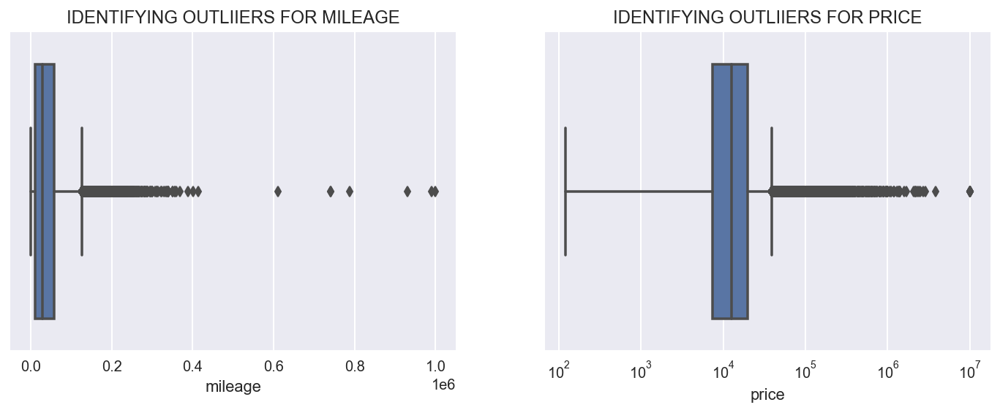

In [133]:
fig, ax = plt.subplots(1,2,figsize=(12,4))

sns.boxplot(x=adverts['mileage'],ax=ax[0])
ax[0].title.set_text('Identifying Outliiers for Mileage'.upper())

sns.boxplot(x=adverts['price'],ax=ax[1])
ax[1].title.set_text('Identifying Outliiers for price'.upper())
ax[1].set_xscale('log')

plt.savefig('outliers.png',dpi=300,bbox_inches='tight')

In [134]:
adverts[['standard_make','standard_model','year_of_registration','mileage', 'price']].sort_values(by='mileage', ascending=False)[:10]

,standard_make,standard_model,year_of_registration,mileage,price
43974,Vauxhall,Astra,2013,999999.0,9999
63569,Vauxhall,Zafira,2007,990000.0,1200
85043,BMW,1 Series,2006,930000.0,2500
131508,MINI,Countryman,2018,788072.0,22875
240577,Mercedes-Benz,E Class,2011,740000.0,10500
115277,Volvo,XC90,2014,740000.0,14795
333167,Fiat,500,2013,611121.0,4500
77727,SKODA,Octavia,2010,413079.0,1299
178876,BMW,X5,2016,400321.0,28690
382567,SKODA,Superb,2013,388000.0,1989


<font size="4">In general, most modern cars can cross 200,000 miles without any major issues, provided the vehicle is being well-maintained but it is no surprise that many vehicles that have reached 400,000 and even 500,000 miles have received extraordinary care and maintenance, often with the owners doing the routine work themselves.</font>

<font size="4">From the boxplot above, and the subset of the data, I can cap outliers for mileage at values greater than 200,000km/h

In [135]:
#observations gretaer than 400k km/h
adverts.loc[adverts['mileage']>200000].count().values[0]

341

<font size="4"> Handling Outlier in `mileage` column

In [136]:
adverts.loc[adverts['mileage']>200000, 'mileage'] = 200000

#### `price`

In [137]:
adverts['price'].describe().to_frame().T

,count,mean,std,min,25%,50%,75%,max
price,401977.0,17332.995244,46306.320017,120.0,7495.0,12600.0,20000.0,9999999.0


<font size="4">The maximum price of a car is £9,999,999. Plotting a boxplot to visualize how the data points are distributed

In [138]:
# most expensive cars
adverts[['standard_make','standard_model','year_of_registration','vehicle_condition','mileage','price']].sort_values(by='price', ascending=False)[:10]

,standard_make,standard_model,year_of_registration,vehicle_condition,mileage,price
336536,Porsche,959,2017,USED,4400.0,9999999
141833,Ferrari,250,2017,USED,87450.0,9999999
336202,Ferrari,LaFerrari,2017,USED,950.0,9999999
147188,Maserati,3500,2017,USED,100.0,9999999
252505,Ferrari,275,2017,USED,46300.0,9999999
305436,Lamborghini,Miura,2017,USED,3600.0,9999999
198060,Ferrari,LaFerrari,2017,USED,300.0,3799995
51741,Bugatti,Veyron,2014,USED,4400.0,2850000
64910,McLaren,P1,2017,USED,189.0,2695000
223835,Bugatti,Chiron,2018,USED,1000.0,2500000


<font size="4">Treating the outliers in `price`. A look at the top 10 expensive cars are actually luxurious cars, with most of them having low mileages. However, cars having almost a £10million and are also USED doesn't look real. I verified some of these cars prices and used the year of registration as the productionn year to check the value of the NEW cars, and most of them was a little over £4million.
    
<font size="4">I will drop cars that are greater than £4million 

In [139]:
adverts = adverts[~(adverts['price']>4000000)]

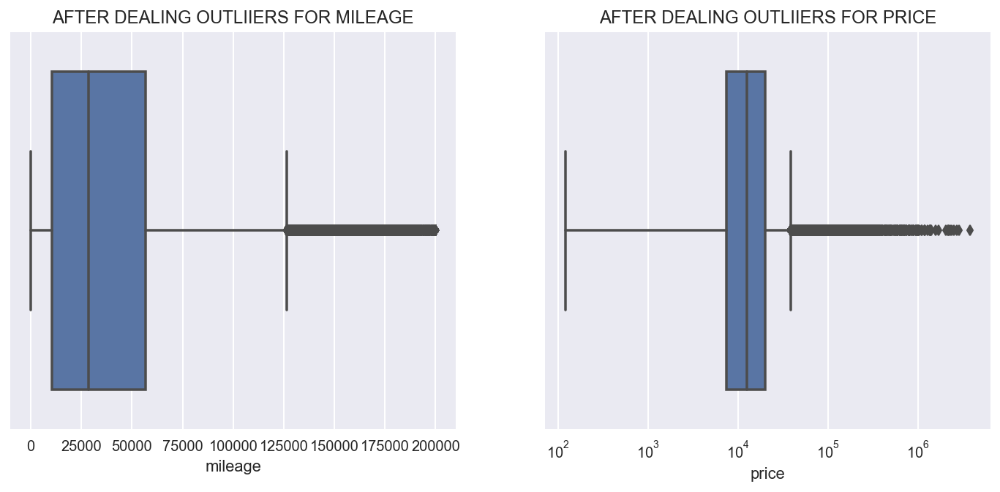

In [140]:
fig, ax = plt.subplots(1,2,figsize=(12,5))

sns.boxplot(x=adverts['mileage'],ax=ax[0])
ax[0].title.set_text('After dealing Outliiers for Mileage'.upper())

sns.boxplot(x=adverts['price'],ax=ax[1])
ax[1].title.set_text('After dealing Outliiers for price'.upper())
ax[1].set_xscale('log')

plt.savefig('afteroutliers.png',dpi=300, bbox_inches='tight')

# Feature Engineering

In [141]:
adverts.head(2)

,public_reference,mileage,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
0,202006039777689,0.0,Grey,Volvo,XC90,NEW,2020,73970,SUV,False,Petrol Plug-in Hybrid
1,202007020778260,108230.0,Blue,Jaguar,XF,USED,2011,7000,Saloon,False,Diesel


#### Create a new column `vehicle_age`

<font size='4'>Creating a new column for age of cars as at when the advert was posted on the website. A critical look at the `public_reference` column shows the year, month, day and some ID of each adverts. </font>
1. <font size='4'> I will grab the first 4 digits from the public reference column,
2. <font size='4'> Assign to a new column titled (advert_year) 
3. <font size='4'> Subtract the `year_of_registration` from the `advert_year`
4. <font size='4'> Assign the result of step 3 to`vehicle_age`

In [142]:
adverts['advert_year'] = adverts['public_reference'].astype(str).str[:4].astype('int64')

In [143]:
adverts['vehicle_age'] = adverts['advert_year'] - adverts['year_of_registration']

In [144]:
adverts.head(2)

,public_reference,mileage,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type,advert_year,vehicle_age
0,202006039777689,0.0,Grey,Volvo,XC90,NEW,2020,73970,SUV,False,Petrol Plug-in Hybrid,2020,0
1,202007020778260,108230.0,Blue,Jaguar,XF,USED,2011,7000,Saloon,False,Diesel,2020,9


In [145]:
adverts['vehicle_age'].unique()

array([ 0,  9,  3,  4,  5,  7, 12,  1, 10, -1,  8,  2, 11, 36,  6, 17, 14,
       15, 20, 18, 13, 16, 29, 19, 34, 22, 30, 27, 33, 26, 21, 48, -2, 31,
       28, 25, 23, 51, 32, 24, 44, 37, 40, 43, 58, 53, 38, 52, 50, 41, 56,
       87, 39, 35, 42, 49, 47, 46, 54, 59, 55, 63, 57, 66, 45, 65, 60, 64,
       86, 62, 70, 61, -3, 68], dtype=int64)

In [146]:
adverts[adverts['vehicle_age']<0].groupby('vehicle_condition')[['advert_year','year_of_registration','vehicle_age']].value_counts()

vehicle_condition  advert_year  year_of_registration  vehicle_age
NEW                2019         2020                  -1             1157
                   2018         2020                  -2               27
USED               2019         2020                  -1              299
                   2018         2019                  -1                7
                                2020                  -2                3
                   2017         2018                  -1                2
                                2020                  -3                2
                   2015         2017                  -2                1
                   2016         2017                  -1                1
                                2018                  -2                1
dtype: int64

In [147]:
# replace -1 to 0 for observation that have advert year=2019, year of registration=2020, vehicle age=-1, and are also used cars
# for Used cars
(adverts.loc[(adverts['advert_year']==2019) 
         & (adverts['year_of_registration']==2020) 
         & (adverts['vehicle_condition']=='USED')
         & (adverts['vehicle_age']==-1),
         'vehicle_age']
) = 0

# for new cars
(adverts.loc[(adverts['advert_year']==2019) 
         & (adverts['year_of_registration']==2020) 
         & (adverts['vehicle_condition']=='NEW')
         & (adverts['vehicle_age']==-1),
         'vehicle_age']
) = 0

(adverts.loc[(adverts['advert_year']==2018) 
         & (adverts['year_of_registration']==2020) 
         & (adverts['vehicle_condition']=='NEW')
         & (adverts['vehicle_age']==-2),
         'vehicle_age']
) = 0

In [148]:
adverts[adverts['vehicle_age']<0].groupby('vehicle_condition')[['advert_year','year_of_registration','vehicle_age']].value_counts()

vehicle_condition  advert_year  year_of_registration  vehicle_age
USED               2018         2019                  -1             7
                                2020                  -2             3
                   2017         2018                  -1             2
                                2020                  -3             2
                   2015         2017                  -2             1
                   2016         2017                  -1             1
                                2018                  -2             1
dtype: int64

<font size="4">Taking the absolute values of the remaining negavtive values in `vehicle_age` column

In [149]:
adverts.loc[adverts['vehicle_age']<0, 'vehicle_age'] = abs(adverts[adverts['vehicle_age']<0]['vehicle_age'])

In [150]:
adverts[adverts['vehicle_age']<0]

,public_reference,mileage,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type,advert_year,vehicle_age


#### Create a column for average miles travelled by a car each year 

<font size="4"> That's dividing the `mileage` by the `vehicle_age`

In [151]:
adverts['avg_miles_per_year'] = adverts['mileage'] / adverts['vehicle_age']

In [152]:
adverts['avg_miles_per_year'].isnull().sum()

16164

<font size="4">There are over 16,000 missing values in the newly created column. This is because we have **0** dividing **0** from the `mileage` and `vehicle_age` division

In [153]:
adverts[adverts['avg_miles_per_year'].isnull()].head()

,public_reference,mileage,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type,advert_year,vehicle_age,avg_miles_per_year
0,202006039777689,0.0,Grey,Volvo,XC90,NEW,2020,73970,SUV,False,Petrol Plug-in Hybrid,2020,0,NaN
19,202008272998331,0.0,White,Volkswagen,T-Cross,NEW,2020,25000,SUV,False,Petrol,2020,0,NaN
37,202001306737473,0.0,White,Fiat,Panda,NEW,2020,13999,Hatchback,False,Petrol,2020,0,NaN
44,202003178531910,0.0,Silver,Honda,Civic,NEW,2020,19495,Hatchback,False,Petrol,2020,0,NaN
45,202003318812338,0.0,Grey,Volvo,S60,NEW,2020,40264,Saloon,False,Petrol,2020,0,NaN


In [154]:
# fill those missing values with zeros
adverts['avg_miles_per_year'].fillna(0,inplace=True)

In [155]:
adverts[adverts['avg_miles_per_year']<0].head()

,public_reference,mileage,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type,advert_year,vehicle_age,avg_miles_per_year


In [156]:
adverts['avg_miles_per_year'].value_counts()

inf             46183
0.000000e+00    16207
1.000000e+04     2343
8.000000e+03     1956
7.000000e+03     1923
                ...  
7.914800e+03        1
5.187571e+03        1
6.001800e+03        1
8.564750e+03        1
6.793818e+03        1
Name: avg_miles_per_year, Length: 113776, dtype: int64

<font size="4">In situations where `vehicle_age` is **0** and `mileage` is greater than 0, pandas returns an (infinite ***(inf)***) value when you have a number that's not divisible by 0

In [157]:
adverts[adverts['avg_miles_per_year']==np.inf].head()

,public_reference,mileage,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type,advert_year,vehicle_age,avg_miles_per_year
17,201911043995897,5.0,Black,Nissan,X-Trail,NEW,2020,27595,SUV,False,Diesel,2019,0,inf
33,201910012817451,4445.0,White,Volvo,V40,USED,2019,16980,Hatchback,False,Diesel,2019,0,inf
34,201910022887138,12999.0,White,Peugeot,208,USED,2019,9995,Hatchback,False,Petrol,2019,0,inf
57,202007161315831,10.0,White,BMW,3 Series,NEW,2020,38905,Estate,False,Diesel,2020,0,inf
76,202008152524052,4290.0,Blue,Volkswagen,Golf,USED,2020,28190,Hatchback,False,Petrol,2020,0,inf


<font size="4">Replacing the infinite ***(inf)*** values with the mileage value of that particular index

In [158]:
adverts.loc[adverts['avg_miles_per_year']==np.inf, 'avg_miles_per_year'] = adverts[adverts['avg_miles_per_year']==np.inf]['mileage']

In [159]:
adverts['avg_miles_per_year'].value_counts()

0.000000        16207
10.000000       12869
5.000000         2438
10000.000000     2377
5000.000000      2336
                ...  
10391.166667        1
11938.750000        1
7616.363636         1
9372.250000         1
6793.818182         1
Name: avg_miles_per_year, Length: 114432, dtype: int64

In [160]:
adverts['avg_miles_per_year'] = adverts['avg_miles_per_year'].astype('int64')

In [161]:
adverts.dtypes

public_reference           int64
mileage                  float64
standard_colour           object
standard_make             object
standard_model            object
vehicle_condition         object
year_of_registration       int64
price                      int64
body_type                 object
crossover_car_and_van       bool
fuel_type                 object
advert_year                int64
vehicle_age                int64
avg_miles_per_year         int64
dtype: object

In [162]:
adverts.head(2)

,public_reference,mileage,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type,advert_year,vehicle_age,avg_miles_per_year
0,202006039777689,0.0,Grey,Volvo,XC90,NEW,2020,73970,SUV,False,Petrol Plug-in Hybrid,2020,0,0
1,202007020778260,108230.0,Blue,Jaguar,XF,USED,2011,7000,Saloon,False,Diesel,2020,9,12025


# Data Transformation

In [163]:
categorical_feat = [col for col in adverts.columns if adverts[col].dtype=='O']
num_feat = [col for col in adverts.columns if col not in categorical_feat][1:]

In [164]:
adverts.dtypes

public_reference           int64
mileage                  float64
standard_colour           object
standard_make             object
standard_model            object
vehicle_condition         object
year_of_registration       int64
price                      int64
body_type                 object
crossover_car_and_van       bool
fuel_type                 object
advert_year                int64
vehicle_age                int64
avg_miles_per_year         int64
dtype: object

In [165]:
adverts['mileage'] = adverts['mileage'].astype('int64')
adverts['crossover_car_and_van'] = adverts['crossover_car_and_van'].astype('category').cat.codes.astype('int64')

In [166]:
adverts.dtypes

public_reference          int64
mileage                   int64
standard_colour          object
standard_make            object
standard_model           object
vehicle_condition        object
year_of_registration      int64
price                     int64
body_type                object
crossover_car_and_van     int64
fuel_type                object
advert_year               int64
vehicle_age               int64
avg_miles_per_year        int64
dtype: object

In [167]:
adverts.head(2)

,public_reference,mileage,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type,advert_year,vehicle_age,avg_miles_per_year
0,202006039777689,0,Grey,Volvo,XC90,NEW,2020,73970,SUV,0,Petrol Plug-in Hybrid,2020,0,0
1,202007020778260,108230,Blue,Jaguar,XF,USED,2011,7000,Saloon,0,Diesel,2020,9,12025


In [168]:
# transforming all object values to upper case
adverts[categorical_feat] = adverts[categorical_feat].apply(lambda x: x.astype(str).str.upper())

In [169]:
# remove spaces inbetween words to form a uniform name 
adverts[categorical_feat] = adverts[categorical_feat].apply(lambda x: x.astype(str).str.replace(' ',''))

In [170]:
adverts[categorical_feat]['standard_model'].nunique()

1135

In [171]:
adverts.loc[adverts['fuel_type']=='NATURALGAS', 'fuel_type'] = 'BIFUEL'

# Subsetting

#### NEW cars

In [172]:
new_cars = adverts.loc[adverts.query("vehicle_condition=='NEW'").index]

In [173]:
new_cars['body_type'].value_counts()

SUV            15182
HATCHBACK      10842
SALOON          1889
ESTATE          1415
COUPE            755
CONVERTIBLE      734
MPV              333
PICKUP            62
COMBIVAN          26
MINIBUS           11
Name: body_type, dtype: int64

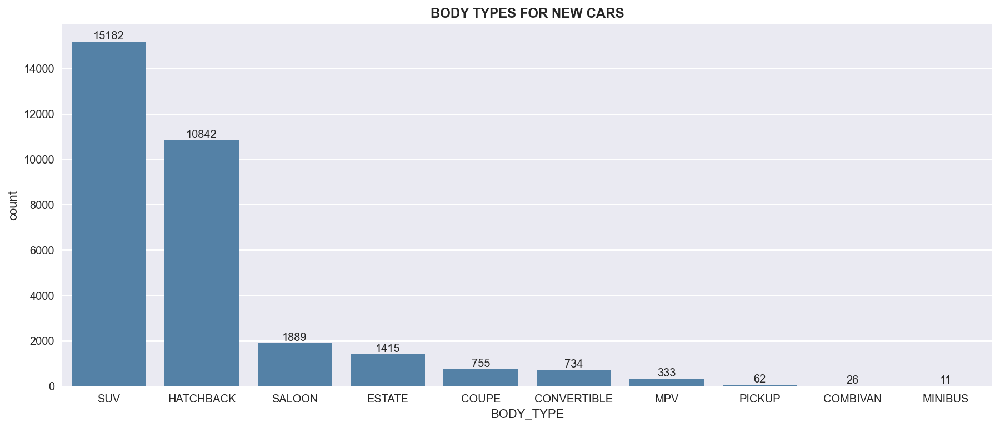

In [174]:
plot_countplot(new_cars, 'body_type','Body types for new cars')
plt.savefig('newcarbodytype.png',dpi=300,bbox_inches='tight')

In [175]:
new_cars['fuel_type'].value_counts()

PETROL                 19207
DIESEL                  6345
PETROLHYBRID            1979
PETROLPLUG-INHYBRID     1563
ELECTRIC                1517
DIESELHYBRID             482
BIFUEL                   146
DIESELPLUG-INHYBRID       10
Name: fuel_type, dtype: int64

In [176]:
new_cars['standard_make'].value_counts()

AUDI             2831
VOLKSWAGEN       2755
FIAT             2673
VOLVO            2002
LANDROVER        1621
BMW              1592
RENAULT          1591
SKODA            1464
SEAT             1365
MERCEDES-BENZ    1326
DACIA            1120
VAUXHALL          978
NISSAN            915
JAGUAR            883
TOYOTA            817
HYUNDAI           806
JEEP              726
MAZDA             704
PEUGEOT           630
SUZUKI            556
CITROEN           535
MITSUBISHI        487
KIA               432
MG                406
ABARTH            386
MINI              336
ALFAROMEO         335
HONDA             254
DSAUTOMOBILES     241
SSANGYONG         165
LEXUS             149
SUBARU             78
ALPINE             28
LOTUS              19
CUPRA              16
MASERATI           10
SMART               7
DODGE               6
CATERHAM            3
MORGAN              1
Name: standard_make, dtype: int64

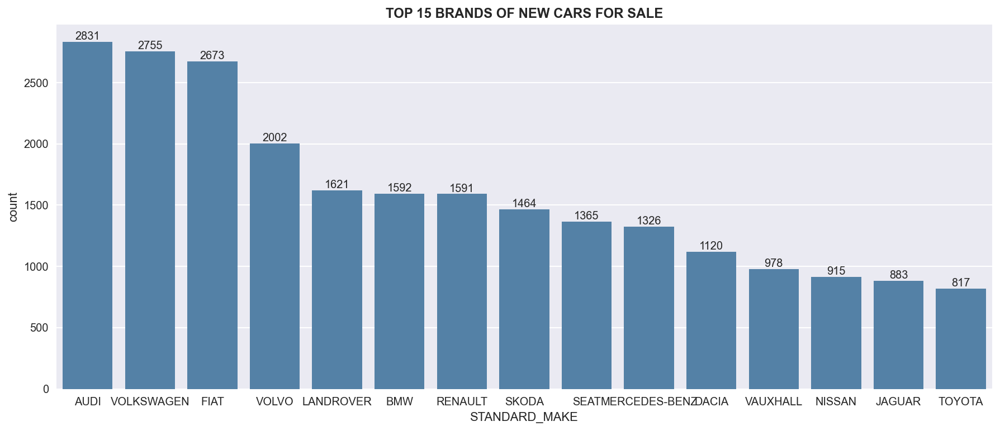

In [177]:
plot_countplot(new_cars,'standard_make','Top 15 brands of new cars for sale',15)
plt.savefig('newcarbrands.png',dpi=300,bbox_inches='tight')

In [178]:
new_cars[['standard_make','standard_model','price']].drop_duplicates(['standard_make','standard_model']).sort_values(by='price',ascending=False).head(10)

,standard_make,standard_model,price
191010,MERCEDES-BENZ,SPRINTER,180000
84423,MERCEDES-BENZ,AMGGT,178755
4185,AUDI,R8,152995
17872,MERCEDES-BENZ,SCLASS,126990
6473,AUDI,RSQ8,116950
143444,BMW,M8GRANCOUPE,110995
27271,BMW,X5M,108925
383,BMW,X6M,107490
11347,AUDI,RS6AVANT,103789
362,LANDROVER,RANGEROVER,102473


In [179]:
new_cars['mileage'].mean()

5.400652820890269

In [180]:
# mean pirce for new cars
new_cars['price'].mean()

32846.232359435504

In [181]:
new_cars['vehicle_age'].value_counts()

0    31249
Name: vehicle_age, dtype: int64

#### USED cars

In [182]:
used_cars = adverts.loc[adverts.query("vehicle_condition=='USED'").index]

In [183]:
used_cars['body_type'].value_counts()

HATCHBACK        156693
SUV              100765
SALOON            34874
ESTATE            23288
COUPE             22652
MPV               15750
CONVERTIBLE       15332
PICKUP              586
COMBIVAN            240
MINIBUS             170
LIMOUSINE           159
CAMPER               92
PANELVAN             61
WINDOWVAN            55
CHASSISCAB            3
CARDERIVEDVAN         2
Name: body_type, dtype: int64

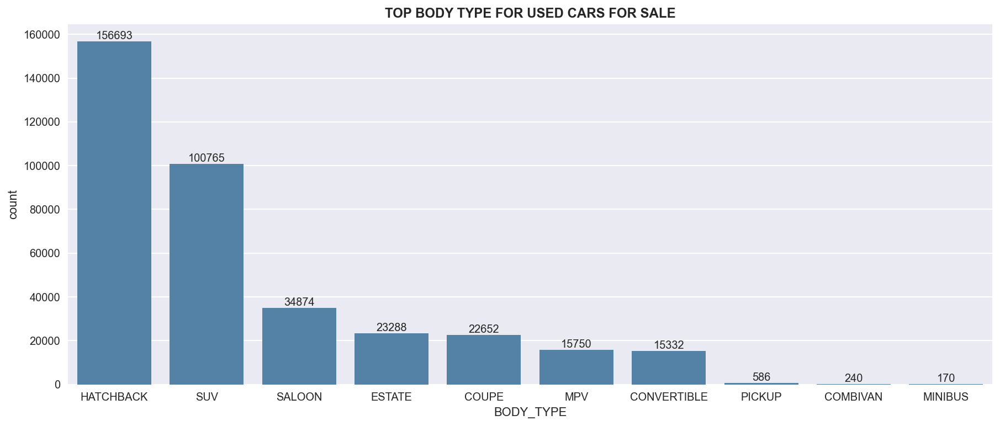

In [184]:
plot_countplot(used_cars,'body_type','Top body type for used cars for sale')
plt.savefig('usedcarbodytype.png',dpi=300,bbox_inches='tight')

In [185]:
used_cars['fuel_type'].value_counts()

PETROL                 197889
DIESEL                 152073
PETROLHYBRID            11715
PETROLPLUG-INHYBRID      4606
ELECTRIC                 3267
DIESELHYBRID              921
DIESELPLUG-INHYBRID       175
BIFUEL                     76
Name: fuel_type, dtype: int64

In [186]:
used_cars['standard_make'].value_counts()

BMW              35782
VAUXHALL         32721
AUDI             32448
VOLKSWAGEN       31491
MERCEDES-BENZ    30590
                 ...  
BRISTOL              1
WOLSELEY             1
PAGANI               1
PANTHER              1
CUSTOMVEHICLE        1
Name: standard_make, Length: 107, dtype: int64

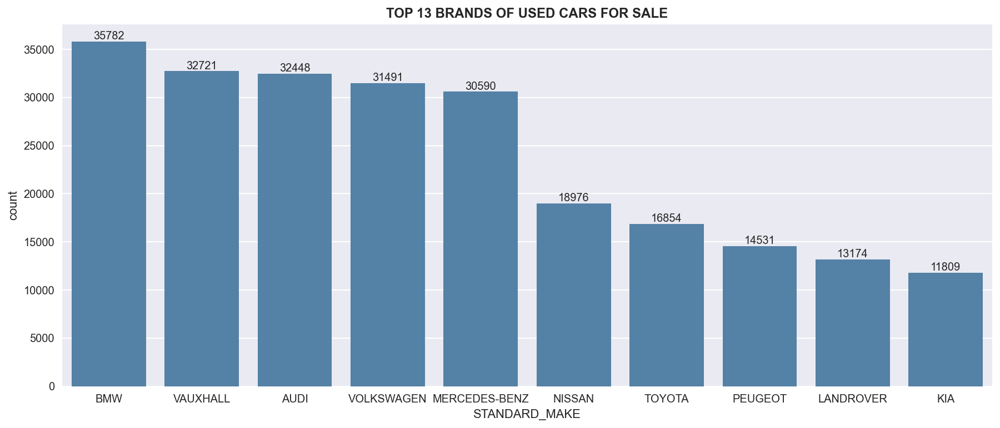

In [187]:
plot_countplot(used_cars,'standard_make','Top 13 brands of used cars for sale',10)
plt.savefig('usedcarbrands.png',dpi=300,bbox_inches='tight')

In [188]:
used_cars[['standard_make','standard_model','price']].drop_duplicates(['standard_make','standard_model']).sort_values(by='price',ascending=False).head(10)

,standard_make,standard_model,price
64910,MCLAREN,P1,2695000
223835,BUGATTI,CHIRON,2500000
94033,PAGANI,HUAYRA,2400000
72681,FERRARI,LAFERRARI,2299950
21997,BUGATTI,VEYRON,1590000
62571,PORSCHE,918,1099950
25507,FERRARI,F40,999975
3399,ASTONMARTIN,DB6,950000
11436,PORSCHE,CARRERAGT,674995
137403,ASTONMARTIN,DB5,649995


In [189]:
used_cars['mileage'].mean()

40878.95652537481

In [190]:
# mean price for used cars
used_cars['price'].mean()

15863.783428013445

# Data Sampling

<font size="4">Using stratified sampling to take a representative sample of the dataset to create some plots for analysis.

In [191]:
def stratified_sample(df,col, N, seed=42):
    grouped = df.groupby(col, group_keys=False)
    rows = grouped.apply(lambda x: x.sample(int(np.rint(N*len(x)/len(df)))))
    samples = rows.sample(frac=1,random_state=seed)
    return samples.reset_index(drop=True)

In [192]:
adverts_stratified = stratified_sample(adverts,['standard_make','standard_model','vehicle_condition'], 4000)
adverts_stratified.shape

(3936, 14)

In [193]:
adverts['vehicle_condition'].value_counts(normalize=True)

USED    0.922261
NEW     0.077739
Name: vehicle_condition, dtype: float64

In [194]:
adverts_stratified['vehicle_condition'].value_counts(normalize=True)

USED    0.924543
NEW     0.075457
Name: vehicle_condition, dtype: float64

# Feature Selection

# Association and Group Differences Analysis

* <font size="4"> Based on Correlation
    * Numerical

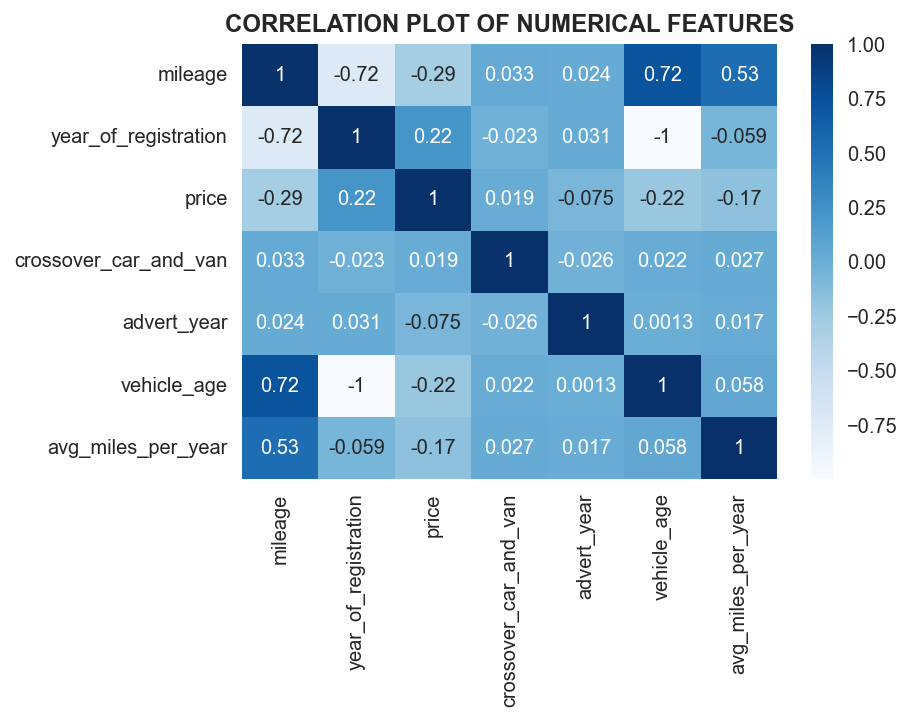

In [195]:
sns.heatmap(adverts[num_feat].corr(),annot=True,cmap='Blues');
plt.title('Correlation plot of numerical features'.upper(), weight='bold', fontsize=12)
plt.savefig('num_corr.png', dpi=300,bbox_inches='tight')

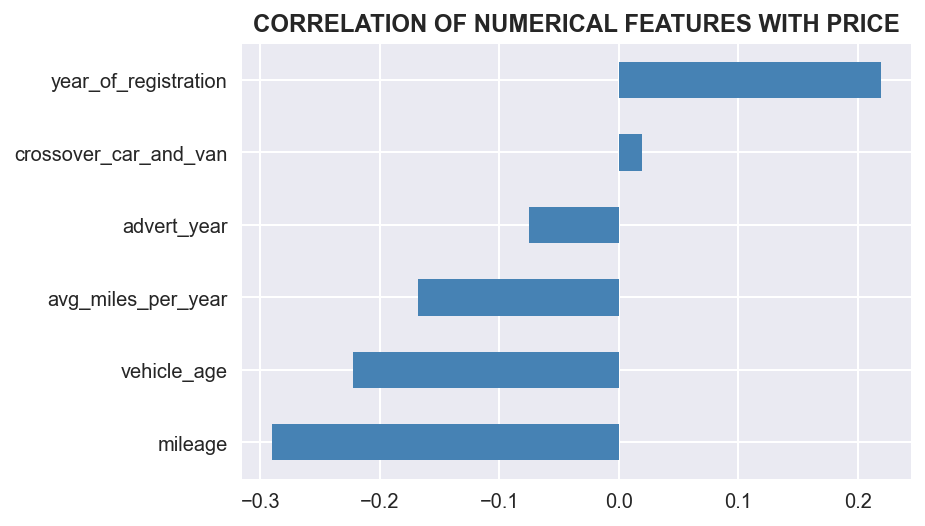

In [196]:
# feature correlation with  price
adverts[num_feat].corr()['price'].drop('price').sort_values(ascending=True).plot(kind='barh',color='steelblue');
plt.title('Correlation of numerical features with price'.upper(), weight='bold', fontsize=12)
plt.savefig('num_corr_with_price.png', dpi=300,bbox_inches='tight')

* <font size="4">Categorical

In [197]:
!pip install -q phik

In [198]:
import phik

In [199]:
cat_with_price = adverts[categorical_feat + ['price']].phik_matrix()

interval columns not set, guessing: ['price']


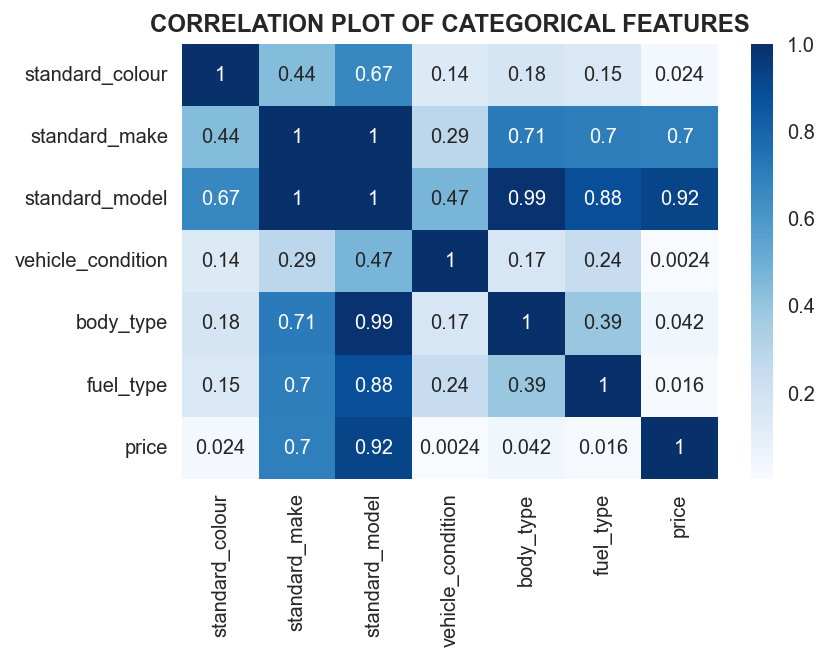

In [200]:
sns.heatmap(cat_with_price,annot=True,cmap='Blues');
plt.title('Correlation plot of categorical features'.upper(), weight='bold', fontsize=12)
plt.savefig('cat_corr.png',dpi=300,bbox_inches='tight')

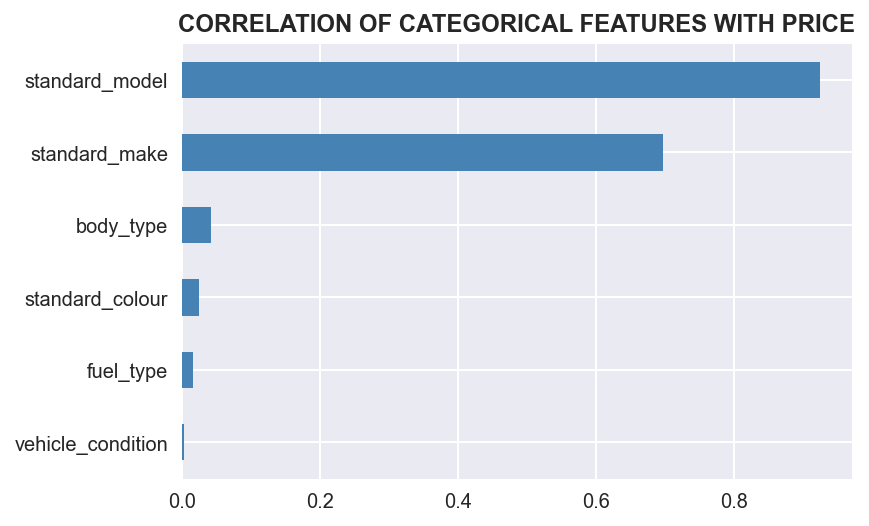

In [201]:
# feature correlation with  price
cat_with_price['price'].drop('price').sort_values(ascending=True).plot(kind='barh',color='steelblue');
plt.title('Correlation of categorical features with price'.upper(),weight='bold',fontsize=12)
plt.savefig('cat_corr_with_price.png',dpi=300,bbox_inches='tight')

## Quantitative - Quantitative
#### <font size="4">Relationship between Price and Mileage & Price and Vehicle Age

<AxesSubplot:xlabel='mileage', ylabel='vehicle_age'>

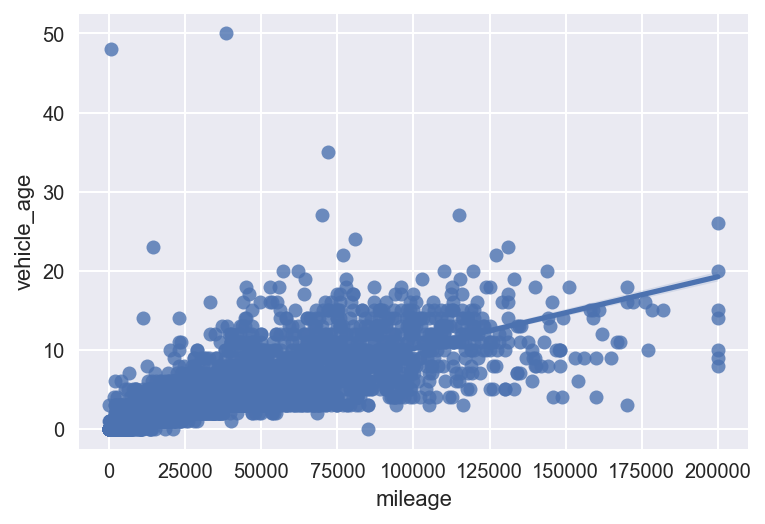

In [204]:
sns.regplot(x='mileage',y='vehicle_age',data=adverts_stratified)


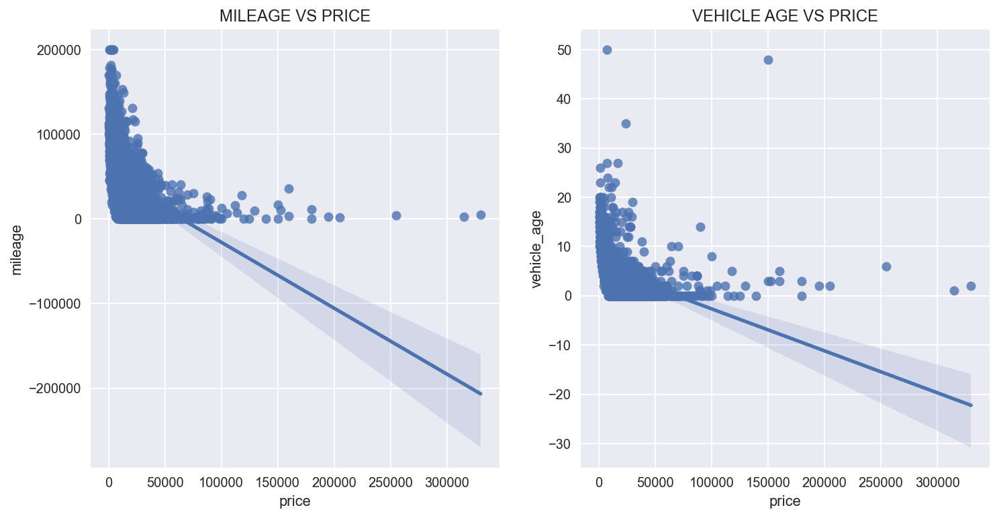

In [207]:
fig, ax = plt.subplots(1,2,figsize=(12,6))
# mileage vs price
sns.regplot(x='price',y='mileage',data=adverts_stratified,ax=ax[0])
ax[0].title.set_text('mileage vs price'.upper());

# vehicle age vs price
sns.regplot(x='price',y='vehicle_age',data=adverts_stratified,ax=ax[1])
ax[1].title.set_text('vehicle age vs price'.upper())

plt.savefig('mileage_vehicleage.png',dpi=300,bbox_inches='tight')

<font size="4">From the plot above, **mileage** and **vehicle_age** are negavtively correlated with price. The higher the mileage, there's a high tendency to have a low price and vice versa. Same applies to the vehicle age.

#### <font size="4">Relationship between Price, year of registration and Fuel type

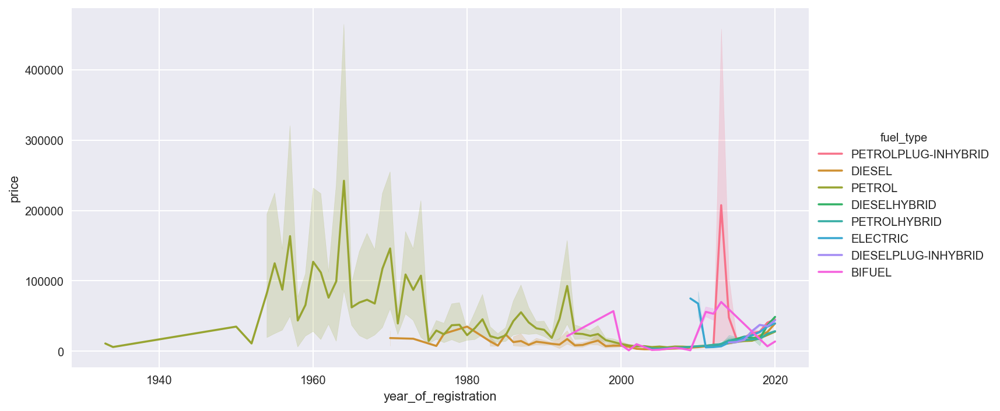

In [205]:
sns.relplot(data=adverts, x="year_of_registration", y="price",color='steelblue',
            kind='line',hue='fuel_type',height=5,aspect=2);
plt.savefig('price_fuel_type_year.png',dpi=300,bbox_inches='tight')

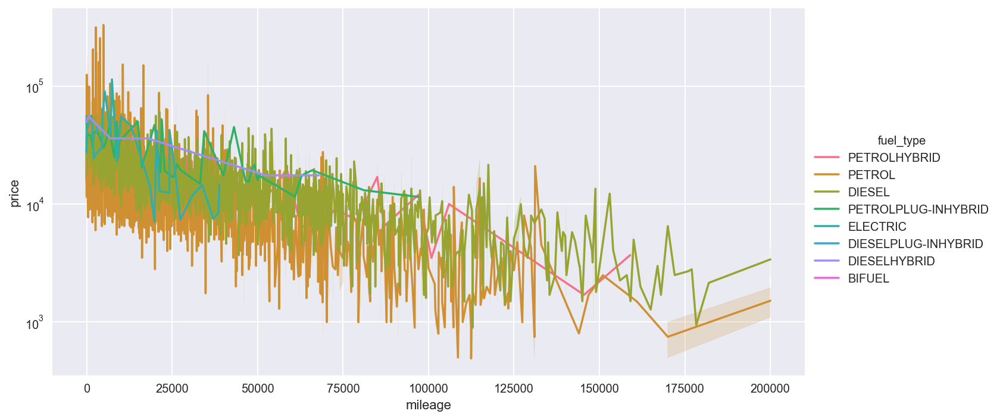

In [206]:
sns.relplot(data=adverts_stratified, x="mileage",y="price",color='steelblue',
            kind='line',hue='fuel_type',height=5,aspect=2);
plt.yscale('log')
plt.savefig('price_fuel_mileage.png',dpi=300,bbox_inches='tight')

## Quantitative - Categorical

In [208]:
def plot_boxenplot(df,quant_col,cat_col,title,Top_N=10):
    # Take the top 10 most frequent from the column
    topN = df[cat_col].value_counts()[:Top_N].index
    if len(topN) > 10:
        plt.figure(figsize=(14,8))
        sns.boxenplot(y=quant_col,x=cat_col ,data=adverts[adverts[cat_col].isin(topN)],showfliers=False)
        plt.xticks(rotation=20)
        plt.title(quant_col.upper() +' vs ' + title.upper(), weight='bold', fontsize=12)
        plt.xlabel(cat_col.upper())
        plt.ylabel(quant_col.upper())
        plt.yscale('log');
    else:
        plt.figure(figsize=(14,8))
        sns.boxenplot(y=quant_col,x=cat_col ,data=adverts[adverts[cat_col].isin(topN)],showfliers=False)
        plt.title(quant_col.upper()+' vs '+title.upper(), weight='bold', fontsize=12)
        plt.xlabel(cat_col.upper())
        plt.ylabel(quant_col.upper())
        plt.yscale('log');

#### <font size="4">Price vs Body Type

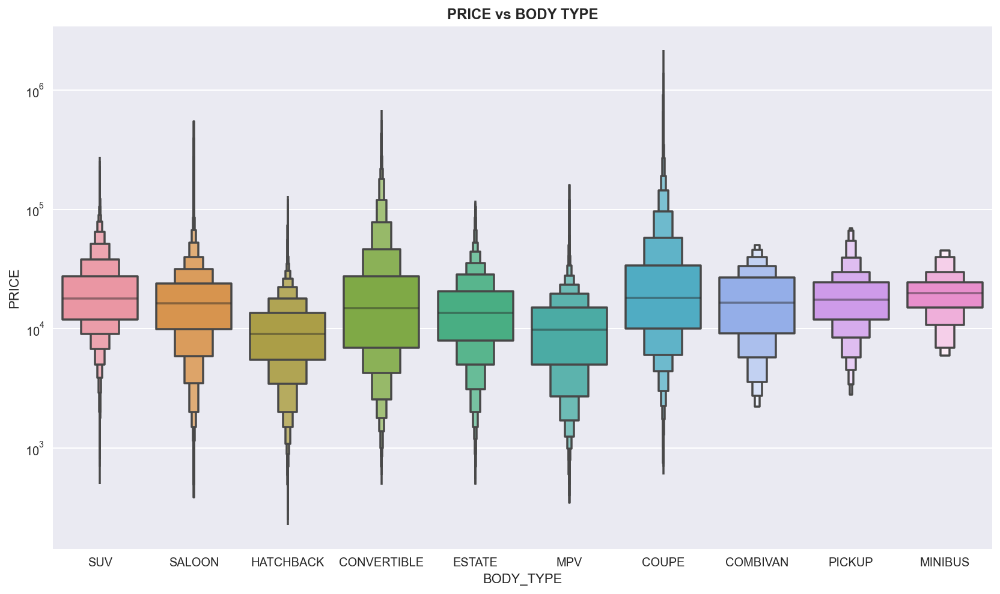

In [209]:
plot_boxenplot(adverts, 'price', 'body_type', 'body type')
plt.savefig('price_body_type.png',dpi=300,bbox_inches='tight')

#### <font size="4">Price vs Standard Make

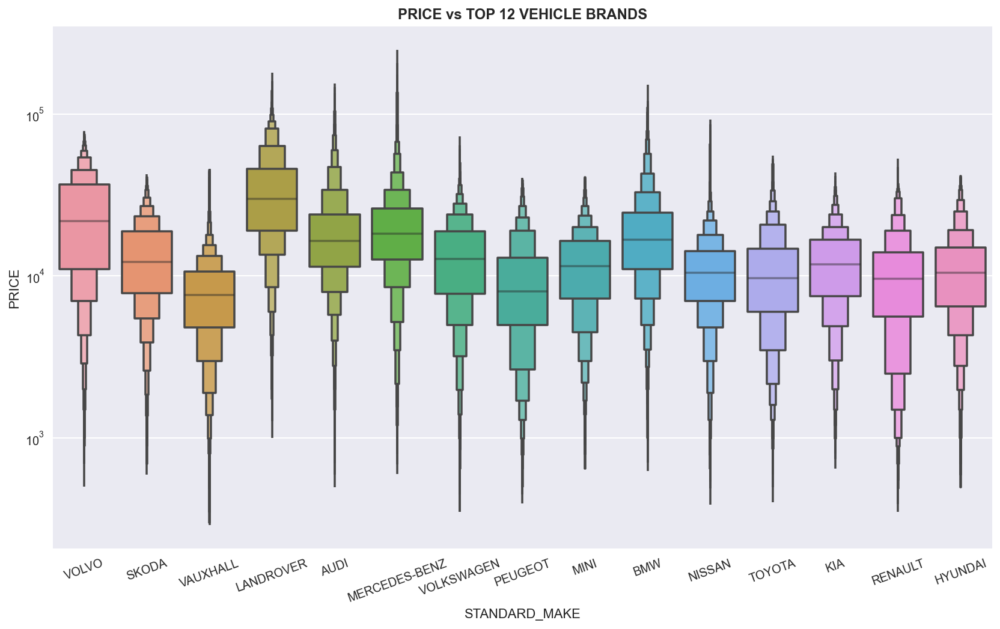

In [210]:
plot_boxenplot(adverts, 'price', 'standard_make', 'top 12 vehicle brands', 15)
plt.savefig('price_brands.png',dpi=300,bbox_inches='tight')

#### <font size="4"> Price vs Fuel type

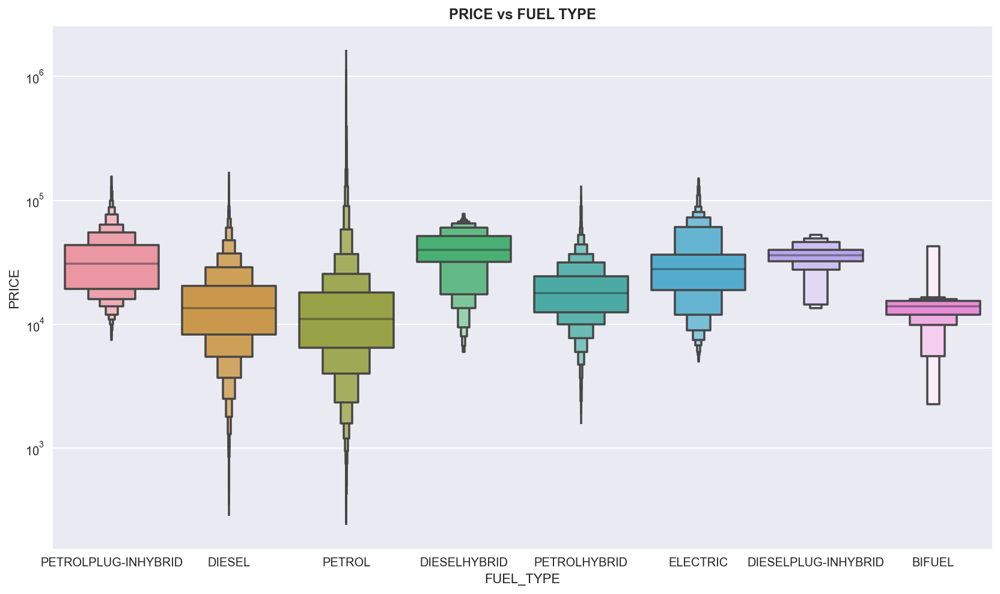

In [211]:
plot_boxenplot(adverts,'price', 'fuel_type', 'Fuel type')
plt.savefig('price_fuel_type.png',dpi=300,bbox_inches='tight')

#### <font size='4'> Mileage Vs Body_type

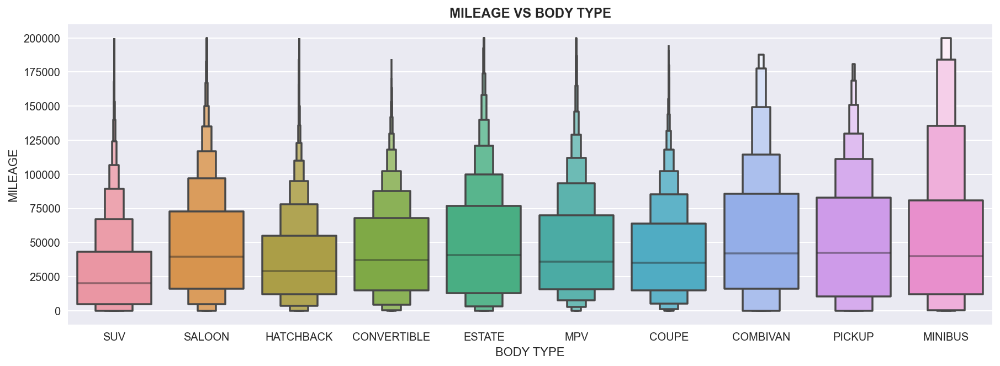

In [212]:
top_N = adverts[adverts['body_type'].isin(adverts['body_type'].value_counts()[:10].index)]
plt.figure(figsize=(15,5))
sns.boxenplot(y='mileage',x='body_type' ,data=top_N,showfliers=False)
plt.title('mileage vs body type'.upper(), weight='bold', fontsize=12)
plt.xlabel('body type'.upper())
plt.ylabel('mileage'.upper());
plt.savefig('mileage_body_type.png',dpi=300,bbox_inches='tight')

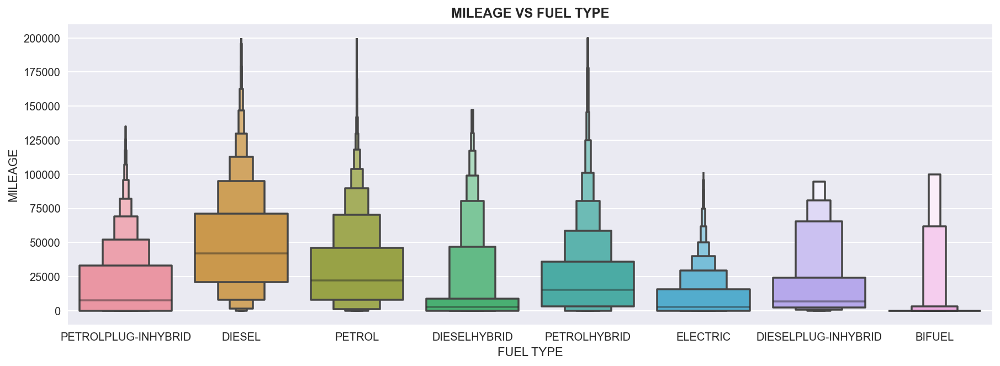

In [213]:
plt.figure(figsize=(15,5))
sns.boxenplot(y='mileage',x='fuel_type' ,data=adverts,showfliers=False)
plt.title('mileage vs fuel type'.upper(), weight='bold', fontsize=12)
plt.xlabel('fuel type'.upper())
plt.ylabel('mileage'.upper());
plt.savefig('mileage_fuel_type.png',dpi=300,bbox_inches='tight')

Text(0.5, 1.0, 'MILEAGE VS FUEL TYPE')

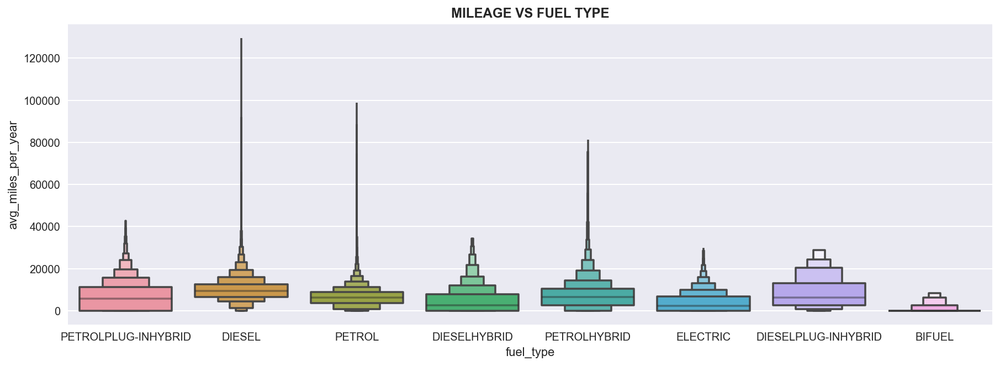

In [214]:
plt.figure(figsize=(15,5))
sns.boxenplot(y='avg_miles_per_year',x='fuel_type' ,data=adverts,showfliers=False)
plt.title('mileage vs fuel type'.upper(), weight='bold', fontsize=12)

In [216]:
adverts[adverts['fuel_type']=='PETROLHYBRID'][adverts[adverts['fuel_type']=='PETROLHYBRID']['mileage']==200000]

,public_reference,mileage,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type,advert_year,vehicle_age,avg_miles_per_year
21406,202008092278846,200000,WHITE,TOYOTA,PRIUS,USED,2015,5995,HATCHBACK,0,PETROLHYBRID,2020,5,40000
21478,202009224047338,200000,BLACK,LEXUS,RX400H,USED,2005,3998,SUV,0,PETROLHYBRID,2020,15,13333
29902,202003218668728,200000,SILVER,TOYOTA,PRIUS,USED,2008,2000,HATCHBACK,0,PETROLHYBRID,2020,12,16666
75395,202007301879115,200000,SILVER,TOYOTA,PRIUS,USED,2010,2700,HATCHBACK,0,PETROLHYBRID,2020,10,20000
85321,202010195194524,200000,WHITE,TOYOTA,PRIUS,USED,2009,3000,HATCHBACK,0,PETROLHYBRID,2020,11,18181
86032,202010225316214,200000,SILVER,LEXUS,RX400H,USED,2005,2989,SUV,0,PETROLHYBRID,2020,15,13333
111898,202007111128849,200000,SILVER,TOYOTA,PRIUS,USED,2010,3390,HATCHBACK,0,PETROLHYBRID,2020,10,20000
114757,202008293089777,200000,SILVER,TOYOTA,PRIUS,USED,2004,1695,HATCHBACK,0,PETROLHYBRID,2020,16,12500
116004,202010265447941,200000,SILVER,TOYOTA,PRIUS,USED,2009,2290,HATCHBACK,0,PETROLHYBRID,2020,11,18181
119559,202010145003303,200000,SILVER,TOYOTA,PRIUS,USED,2011,3890,HATCHBACK,0,PETROLHYBRID,2020,9,22222


## Categorical - Categorical

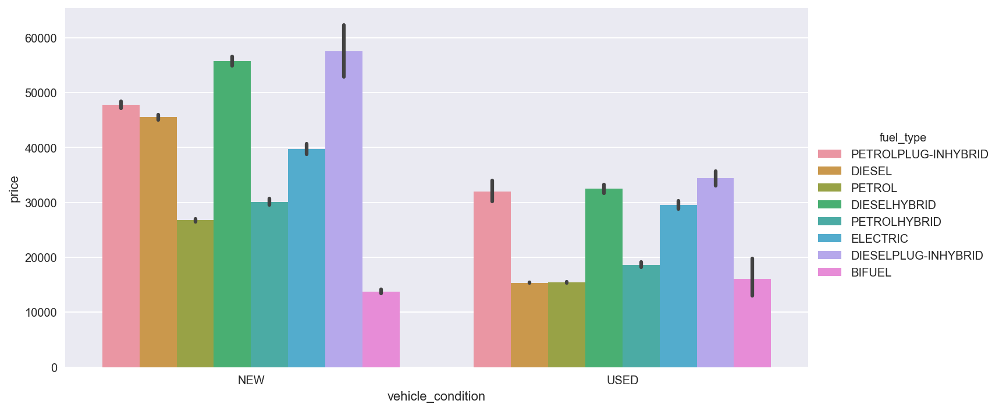

In [217]:
sns.catplot(x="vehicle_condition", y='price',hue="fuel_type", data=adverts, kind='bar',height=5, aspect=2);
plt.savefig('vehicle_condition_fueltype.png',dpi=300,bbox_inches='tight')

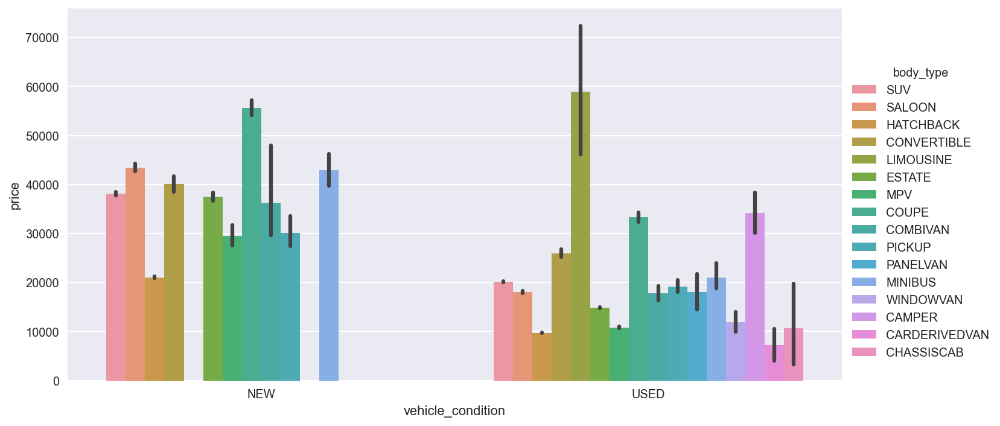

In [218]:
sns.catplot(x="vehicle_condition", y='price',hue="body_type", data=adverts, kind='bar', height=5, aspect=2);
plt.savefig('vehicle_condition_bodytype.png',dpi=300,bbox_inches='tight')

## ADEBO DOLAPO
#### 22539980
#### 13/01/2023